# Employee Performance Analysis

### Code: 10281


# Client Info and Requirement : 

INX Future Inc , (referred as INX ) , is one of the leading data analytics and automation solutions provider with over 15 years of global business presence. INX is consistently rated as top 20 best employers past 5 years.Recent years, the employee performance indexes are not healthy and this is becoming a growing concerns among the top management. There has been increased escalations on service delivery and client satisfaction levels came down by 8 percentage points.CEO, Mr. Brain, knows the issues but concerned to take any actions in penalizing non-performing employees as this would affect the employee morale of all the employees in general and may further reduce the performance.Mr. Brain decided to initiate a data science project , which analyses the current employee data and find the core underlying causes of this performance issues. Mr. Brain, being a data scientist himself, expects the findings of this project will help him to take right course of actions. He also expects a clear indicators of non performing employees, so that any penalization of non-performing employee, if required, may not significantly affect other employee morals.

The following insights are expected from this project:

 * Department wise performances.
 
 * Top 3 Important Factors effecting employee performance.
 
 * A trained model which can predict the employee performance based on     factors as inputs.
 
 * Recommendations to improve the employee performance based on insights   from analysis.







# 1.Importing Libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pandas_profiling import ProfileReport as pr
import plotly.express as px
from sklearn.preprocessing import LabelEncoder
from category_encoders import BinaryEncoder
from scipy import stats
import pylab
from sklearn.feature_selection import VarianceThreshold
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE
from sklearn.metrics import confusion_matrix,accuracy_score,classification_report
from imblearn.over_sampling import SMOTE
from xgboost import XGBClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from catboost import CatBoostClassifier
import warnings
warnings.filterwarnings('ignore')
from scipy.stats import randint
from sklearn.model_selection import RandomizedSearchCV

# 2.Importing Dataset

In [2]:
data = pd.read_excel(r"C:\Users\Hp\Desktop\Intership\IABAC\INX_Future_Inc_Employee_Performance_CDS_Project2_Data_V1.8.xls")
df = data.copy()
df.head()

,EmpNumber,Age,Gender,EducationBackground,MaritalStatus,EmpDepartment,EmpJobRole,BusinessTravelFrequency,DistanceFromHome,EmpEducationLevel,...,EmpRelationshipSatisfaction,TotalWorkExperienceInYears,TrainingTimesLastYear,EmpWorkLifeBalance,ExperienceYearsAtThisCompany,ExperienceYearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Attrition,PerformanceRating
0,E1001000,32,Male,Marketing,Single,Sales,Sales Executive,Travel_Rarely,10,3,...,4,10,2,2,10,7,0,8,No,3
1,E1001006,47,Male,Marketing,Single,Sales,Sales Executive,Travel_Rarely,14,4,...,4,20,2,3,7,7,1,7,No,3
2,E1001007,40,Male,Life Sciences,Married,Sales,Sales Executive,Travel_Frequently,5,4,...,3,20,2,3,18,13,1,12,No,4
3,E1001009,41,Male,Human Resources,Divorced,Human Resources,Manager,Travel_Rarely,10,4,...,2,23,2,2,21,6,12,6,No,3
4,E1001010,60,Male,Marketing,Single,Sales,Sales Executive,Travel_Rarely,16,4,...,4,10,1,3,2,2,2,2,No,3


-> Sucessfully Imported the Dataset

# 3.EDA 

In [3]:
profile_report = pr(df)
profile_report

Summarize dataset:   0%|          | 0/41 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Observations

* No missing values

* EmpNumber is having high cardinality and has unique values.

* EmpJobRole is highly correlated with EmpDepartment

* EmpNumber is Uniformly distributed.

* NumCompaniesWorked has 13.0% zeros values.

* TrainingTimesLastYear has 3.7% zeros values.

* ExperienceYearsAtThisCompany 3.0% zeros values.

* ExperienceYearsInCurrentRole has 15.8% zeros values.

* YearsSinceLastPromotion has 39.1% zeros values.

* YearsWithCurrManager has 17.9% zeros values.

In [4]:
df.head()

,EmpNumber,Age,Gender,EducationBackground,MaritalStatus,EmpDepartment,EmpJobRole,BusinessTravelFrequency,DistanceFromHome,EmpEducationLevel,...,EmpRelationshipSatisfaction,TotalWorkExperienceInYears,TrainingTimesLastYear,EmpWorkLifeBalance,ExperienceYearsAtThisCompany,ExperienceYearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Attrition,PerformanceRating
0,E1001000,32,Male,Marketing,Single,Sales,Sales Executive,Travel_Rarely,10,3,...,4,10,2,2,10,7,0,8,No,3
1,E1001006,47,Male,Marketing,Single,Sales,Sales Executive,Travel_Rarely,14,4,...,4,20,2,3,7,7,1,7,No,3
2,E1001007,40,Male,Life Sciences,Married,Sales,Sales Executive,Travel_Frequently,5,4,...,3,20,2,3,18,13,1,12,No,4
3,E1001009,41,Male,Human Resources,Divorced,Human Resources,Manager,Travel_Rarely,10,4,...,2,23,2,2,21,6,12,6,No,3
4,E1001010,60,Male,Marketing,Single,Sales,Sales Executive,Travel_Rarely,16,4,...,4,10,1,3,2,2,2,2,No,3


### 1. Age

##### PerformanceRating = 2

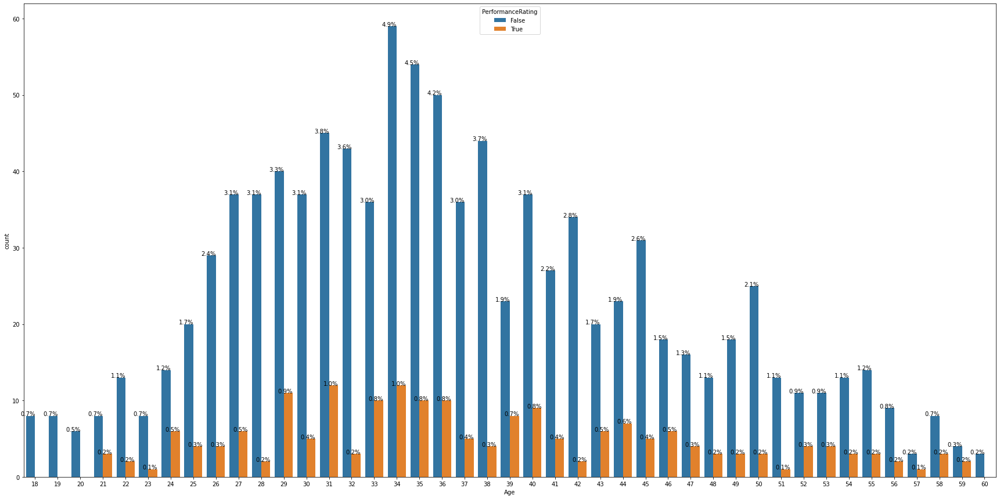

In [5]:
plt.figure(figsize=(30,15))
ax = sns.countplot(df.Age,hue=df.PerformanceRating == 2)
total = float(len(df))
for p in ax.patches:
    percentage = '{:.1f}%'.format(100 * p.get_height()/total)
    x = p.get_x() + p.get_width()
    y = p.get_height()
    ax.annotate(percentage, (x, y),ha='right')
plt.show()

#### Observations

-> Min age is 18 and max age is 60

-> people between age 21 and 60 is having performance rating as 2

-> 16.1% of the people is having perfornace rating as 2

##### PerformanceRating = 3

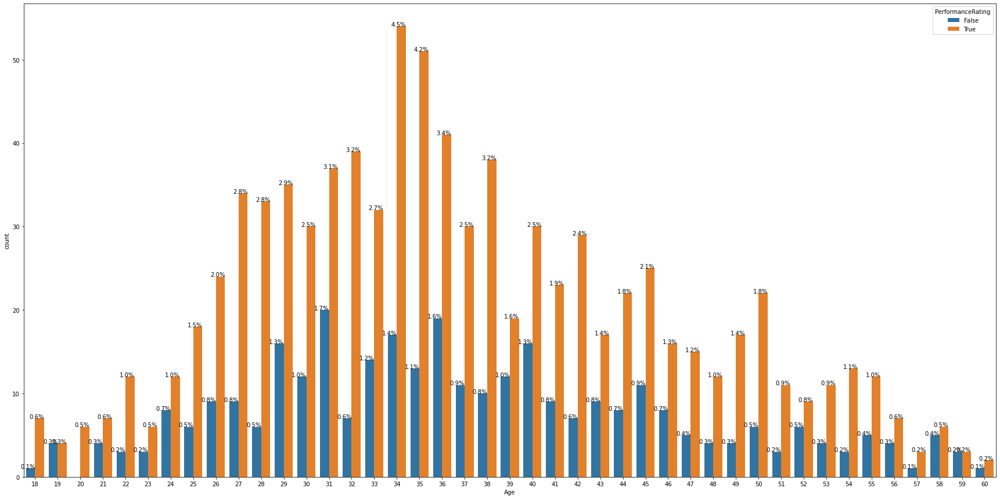

In [6]:
plt.figure(figsize=(30,15))
ax = sns.countplot(df.Age,hue=df.PerformanceRating == 3)
total = float(len(df))
for p in ax.patches:
    percentage = '{:.1f}%'.format(100 * p.get_height()/total)
    x = p.get_x() + p.get_width()
    y = p.get_height()
    ax.annotate(percentage, (x, y),ha='right')
plt.show()

#### Observations

-> 72.9% percentage of the people have is having performance rating as 3

-> Age 34 is having the highest number of people with performance rating as 3

-> From age 24 to 35 we can see an increased number of people  having the performance rating as 3.

-> After after age 35 we can see an increase and drop simultaneously.

##### PerformanceRating = 4

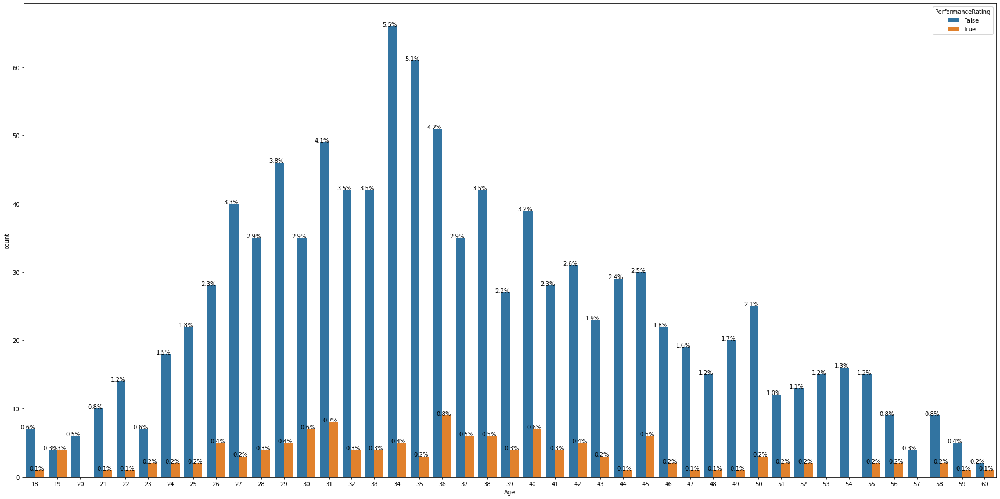

In [7]:
plt.figure(figsize=(30,15))
ax = sns.countplot(df.Age,hue=df.PerformanceRating == 4)
total = float(len(df))
for p in ax.patches:
    percentage = '{:.1f}%'.format(100 * p.get_height()/total)
    x = p.get_x() + p.get_width()
    y = p.get_height()
    ax.annotate(percentage, (x, y),ha='right')
plt.show()

#### Observations

-> 11%  of people is having performance rating as 4

-> Age 38 is having the highest number of people with performance rating as 4

-> From this it is clear that only minority of the people is having higher performance rating

### 2. Gender

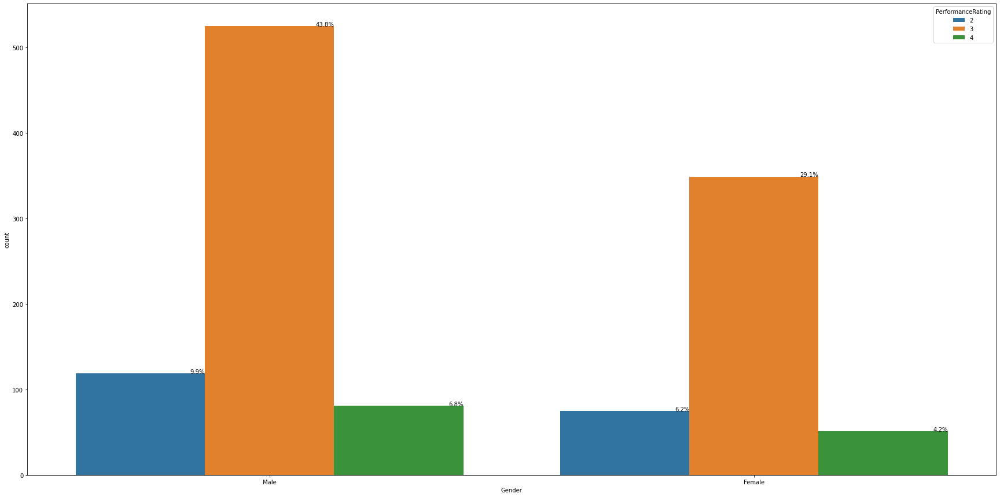

In [8]:
plt.figure(figsize=(30,15))
ax = sns.countplot(df.Gender,hue=df.PerformanceRating)
total = float(len(df))
for p in ax.patches:
    percentage = '{:.1f}%'.format(100 * p.get_height()/total)
    x = p.get_x() + p.get_width()
    y = p.get_height()
    ax.annotate(percentage, (x, y),ha='right')
plt.show()

#### Observations

-> 72.9% of the people is having performance rating as 3. In that 43.8% are males and 29.1 percentage is female

-> Males are higher in number than females.

-> 16.1% peoples are having performance rating as 2. In that 9.9% is males and 6.2% is females

-> 11% of people is having performance rating as 4. In that 6.8% percentage is male and 4.2% is female

### 3. Analysis of Department wise Performance

In [9]:
dept_per = data.groupby(["EmpDepartment"])["PerformanceRating"].mean()
dept_per.sort_values(ascending = False)

EmpDepartment
Development               3.085873
Data Science              3.050000
Human Resources           2.925926
Research & Development    2.921283
Sales                     2.860590
Finance                   2.775510
Name: PerformanceRating, dtype: float64

In [10]:
dept_per = data.groupby(["EmpDepartment"])["PerformanceRating"].value_counts()
dept_per

EmpDepartment           PerformanceRating
Data Science            3                     17
                        4                      2
                        2                      1
Development             3                    304
                        4                     44
                        2                     13
Finance                 3                     30
                        2                     15
                        4                      4
Human Resources         3                     38
                        2                     10
                        4                      6
Research & Development  3                    234
                        2                     68
                        4                     41
Sales                   3                    251
                        2                     87
                        4                     35
Name: PerformanceRating, dtype: int64

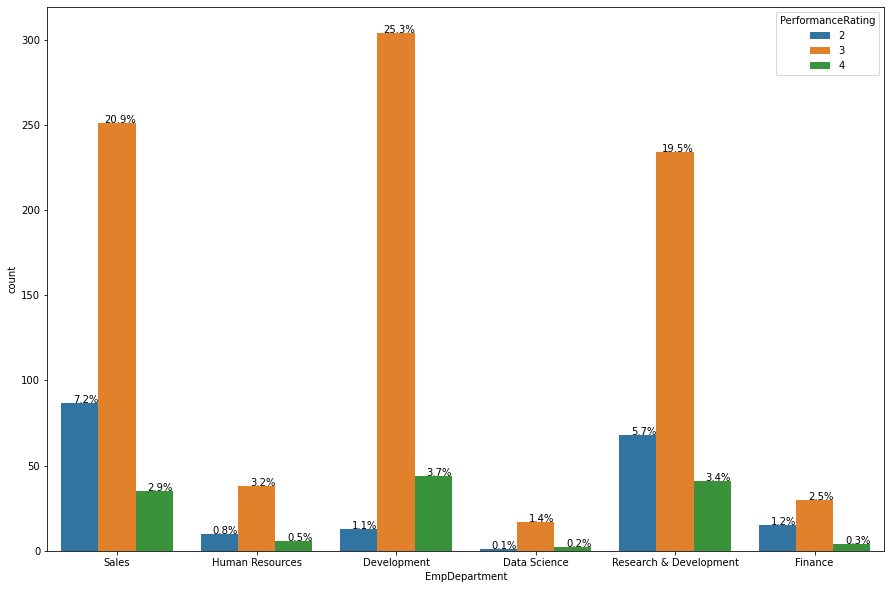

In [11]:
plt.figure(figsize=(15,10))
ax = sns.countplot(df.EmpDepartment,hue=df.PerformanceRating)
total = float(len(df))
for p in ax.patches:
    percentage = '{:.1f}%'.format(100 * p.get_height()/total)
    x = p.get_x() + p.get_width()
    y = p.get_height()
    ax.annotate(percentage, (x, y),ha='right')
plt.show()

#### Observations

-> From the plot it is clear that the Development is having higher performance rating than other departments. 25.3% of the people is having 3 as their performance rating.

-> Mean performance of all depatments are
*Development         =      3.085873

*Data Science        =      3.050000

*Human Resources     =      2.925926

*Research & Development=    2.921283

*Sales               =      2.860590

*Finance             =      2.775510


### 4. Pair plot

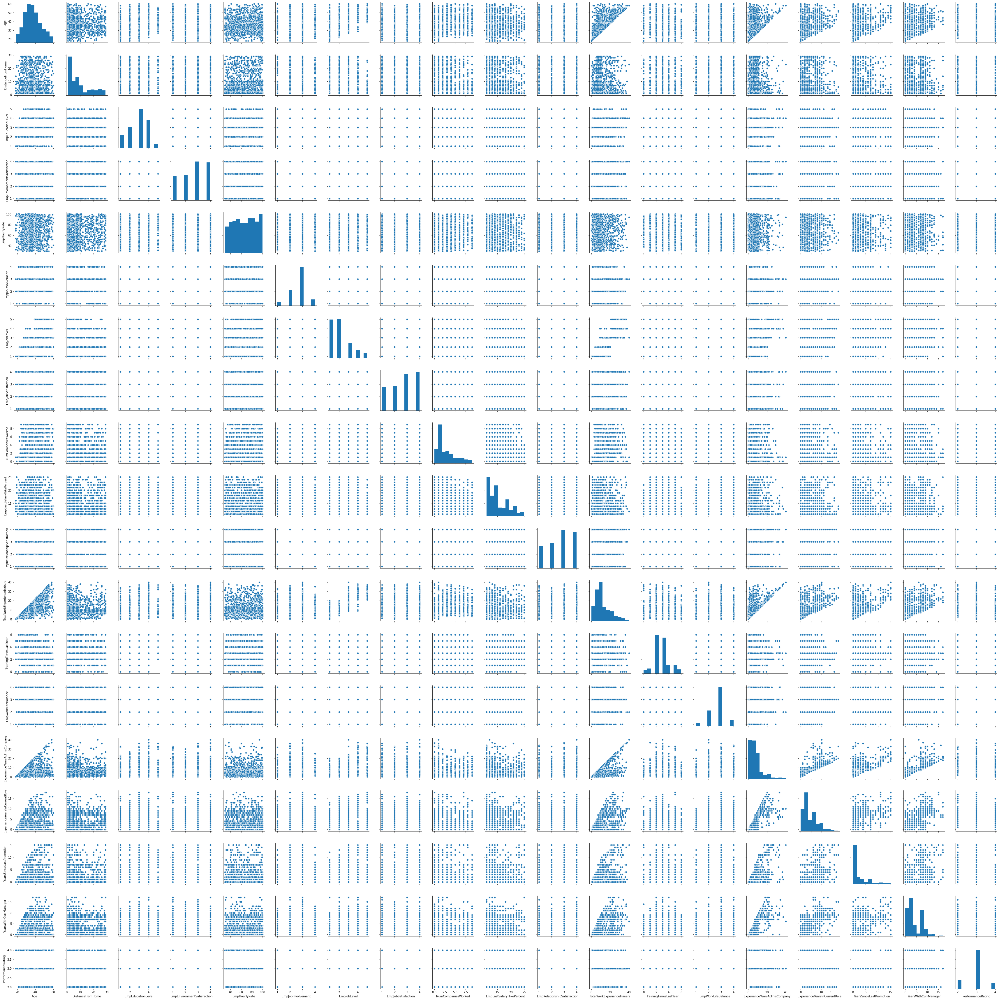

In [12]:
sns.pairplot(df)

### 5. EmpLastSalaryHikePercent

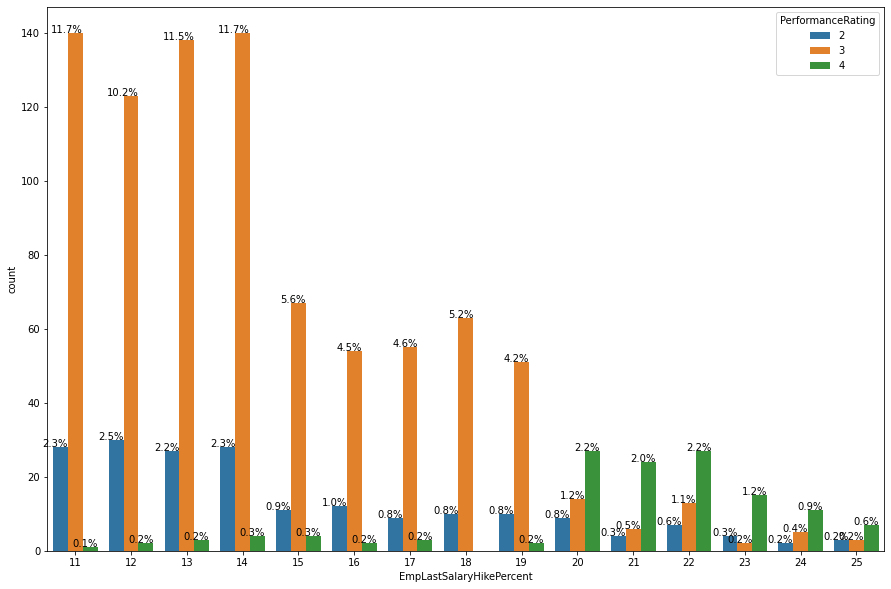

In [14]:
plt.figure(figsize=(15,10))
ax = sns.countplot(df.EmpLastSalaryHikePercent,hue=df.PerformanceRating)
total = float(len(df))
for p in ax.patches:
    percentage = '{:.1f}%'.format(100 * p.get_height()/total)
    x = p.get_x() + p.get_width()
    y = p.get_height()
    ax.annotate(percentage, (x, y),ha='right')
plt.show()

### 6. EmpEnvironmentSatisfaction

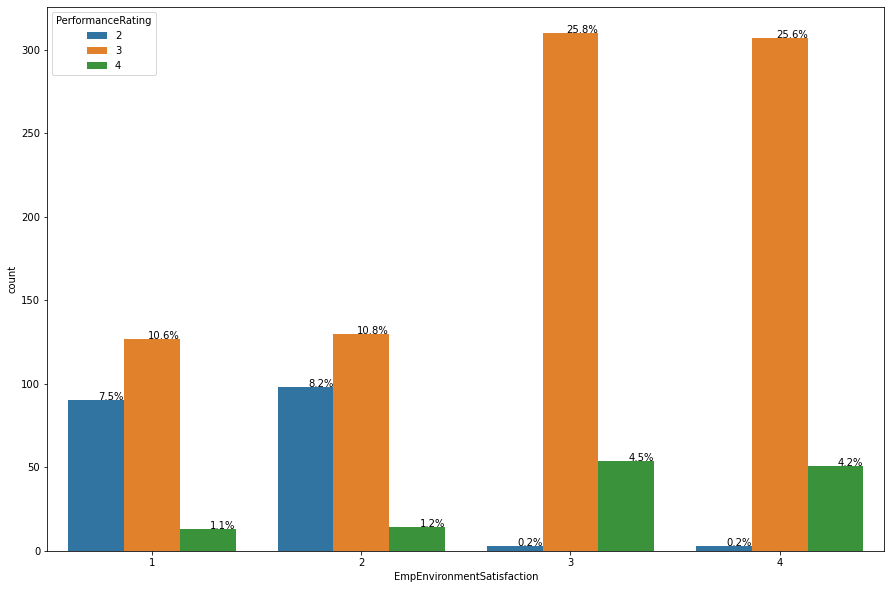

In [15]:
plt.figure(figsize=(15,10))
ax = sns.countplot(df.EmpEnvironmentSatisfaction,hue=df.PerformanceRating)
total = float(len(df))
for p in ax.patches:
    percentage = '{:.1f}%'.format(100 * p.get_height()/total)
    x = p.get_x() + p.get_width()
    y = p.get_height()
    ax.annotate(percentage, (x, y),ha='right')
plt.show()

#### Observations

-> From this it is clear that higher the enviornment satisfaction, higher ther performance rating.


# 4. Encoding Categorical columns

In [16]:
print(df.select_dtypes(exclude='number').columns)

Index(['EmpNumber', 'Gender', 'EducationBackground', 'MaritalStatus',
       'EmpDepartment', 'EmpJobRole', 'BusinessTravelFrequency', 'OverTime',
       'Attrition'],
      dtype='object')


-> These are the list of features that we need to encode( Here EmpNumber is avoided because it is having unique values)

#### a. Gender

-> Gender is a nominal data so we can go with One Hot Encoding technique

In [17]:
df.Gender.value_counts()

Male      725
Female    475
Name: Gender, dtype: int64

In [18]:
df.Gender = pd.get_dummies(df.Gender,drop_first=True)

In [19]:
df.head()

,EmpNumber,Age,Gender,EducationBackground,MaritalStatus,EmpDepartment,EmpJobRole,BusinessTravelFrequency,DistanceFromHome,EmpEducationLevel,...,EmpRelationshipSatisfaction,TotalWorkExperienceInYears,TrainingTimesLastYear,EmpWorkLifeBalance,ExperienceYearsAtThisCompany,ExperienceYearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Attrition,PerformanceRating
0,E1001000,32,1,Marketing,Single,Sales,Sales Executive,Travel_Rarely,10,3,...,4,10,2,2,10,7,0,8,No,3
1,E1001006,47,1,Marketing,Single,Sales,Sales Executive,Travel_Rarely,14,4,...,4,20,2,3,7,7,1,7,No,3
2,E1001007,40,1,Life Sciences,Married,Sales,Sales Executive,Travel_Frequently,5,4,...,3,20,2,3,18,13,1,12,No,4
3,E1001009,41,1,Human Resources,Divorced,Human Resources,Manager,Travel_Rarely,10,4,...,2,23,2,2,21,6,12,6,No,3
4,E1001010,60,1,Marketing,Single,Sales,Sales Executive,Travel_Rarely,16,4,...,4,10,1,3,2,2,2,2,No,3


-> Sucessfully encoded

#### b. EducationalBackground

In [20]:
df.EducationBackground.value_counts()

Life Sciences       492
Medical             384
Marketing           137
Technical Degree    100
Other                66
Human Resources      21
Name: EducationBackground, dtype: int64

-> While considering Educatoinal background it is found that all the categories are having equal importance.So it can be considered as a nominal data. So we can use onehot encoding.

In [21]:
edu_back = pd.get_dummies(df.EducationBackground,drop_first=True)
df.drop(columns=['EducationBackground'],inplace=True) #dropping EducationalBackground
df = pd.concat([df,edu_back],axis=1) # appending edu_back to the dataframe
df.head()

,EmpNumber,Age,Gender,MaritalStatus,EmpDepartment,EmpJobRole,BusinessTravelFrequency,DistanceFromHome,EmpEducationLevel,EmpEnvironmentSatisfaction,...,ExperienceYearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Attrition,PerformanceRating,Life Sciences,Marketing,Medical,Other,Technical Degree
0,E1001000,32,1,Single,Sales,Sales Executive,Travel_Rarely,10,3,4,...,7,0,8,No,3,0,1,0,0,0
1,E1001006,47,1,Single,Sales,Sales Executive,Travel_Rarely,14,4,4,...,7,1,7,No,3,0,1,0,0,0
2,E1001007,40,1,Married,Sales,Sales Executive,Travel_Frequently,5,4,4,...,13,1,12,No,4,1,0,0,0,0
3,E1001009,41,1,Divorced,Human Resources,Manager,Travel_Rarely,10,4,2,...,6,12,6,No,3,0,0,0,0,0
4,E1001010,60,1,Single,Sales,Sales Executive,Travel_Rarely,16,4,1,...,2,2,2,No,3,0,1,0,0,0


-> Sucessfully encoded EducationalBackground

### c. Martial Status

In [22]:
df.MaritalStatus.value_counts()

Married     548
Single      384
Divorced    268
Name: MaritalStatus, dtype: int64

-> Martial status is nominal so we can use one hot encoding

In [23]:
matial_status = pd.get_dummies(df.MaritalStatus,drop_first=True)
df.drop(columns=['MaritalStatus'],inplace=True)
df = pd.concat([df,matial_status],axis=1)
df.head()

,EmpNumber,Age,Gender,EmpDepartment,EmpJobRole,BusinessTravelFrequency,DistanceFromHome,EmpEducationLevel,EmpEnvironmentSatisfaction,EmpHourlyRate,...,YearsWithCurrManager,Attrition,PerformanceRating,Life Sciences,Marketing,Medical,Other,Technical Degree,Married,Single
0,E1001000,32,1,Sales,Sales Executive,Travel_Rarely,10,3,4,55,...,8,No,3,0,1,0,0,0,0,1
1,E1001006,47,1,Sales,Sales Executive,Travel_Rarely,14,4,4,42,...,7,No,3,0,1,0,0,0,0,1
2,E1001007,40,1,Sales,Sales Executive,Travel_Frequently,5,4,4,48,...,12,No,4,1,0,0,0,0,1,0
3,E1001009,41,1,Human Resources,Manager,Travel_Rarely,10,4,2,73,...,6,No,3,0,0,0,0,0,0,0
4,E1001010,60,1,Sales,Sales Executive,Travel_Rarely,16,4,1,84,...,2,No,3,0,1,0,0,0,0,1


### d. EmpDepartment

In [24]:
df.EmpDepartment.value_counts()

Sales                     373
Development               361
Research & Development    343
Human Resources            54
Finance                    49
Data Science               20
Name: EmpDepartment, dtype: int64

-> Here EmpDepartment can be considered as an ordinal data. So we can group the data on the bascis of performance rating.

In [25]:
dept_per = df.groupby(['EmpDepartment'])['PerformanceRating'].mean().sort_values(ascending=False)
dept_per

EmpDepartment
Development               3.085873
Data Science              3.050000
Human Resources           2.925926
Research & Development    2.921283
Sales                     2.860590
Finance                   2.775510
Name: PerformanceRating, dtype: float64

-> We are going to use map encoding in such a way that highest value is given to the department with highest performace rate.

In [26]:
val_map = {
    'Development'            : 6 ,
    'Data Science'           : 5 ,
    'Human Resources'        : 4 ,
    'Research & Development' : 3 ,
    'Sales'                  : 2 ,
    'Finance'                : 1
}

In [27]:
df.EmpDepartment = df.EmpDepartment.map(val_map)
df.head()

,EmpNumber,Age,Gender,EmpDepartment,EmpJobRole,BusinessTravelFrequency,DistanceFromHome,EmpEducationLevel,EmpEnvironmentSatisfaction,EmpHourlyRate,...,YearsWithCurrManager,Attrition,PerformanceRating,Life Sciences,Marketing,Medical,Other,Technical Degree,Married,Single
0,E1001000,32,1,2,Sales Executive,Travel_Rarely,10,3,4,55,...,8,No,3,0,1,0,0,0,0,1
1,E1001006,47,1,2,Sales Executive,Travel_Rarely,14,4,4,42,...,7,No,3,0,1,0,0,0,0,1
2,E1001007,40,1,2,Sales Executive,Travel_Frequently,5,4,4,48,...,12,No,4,1,0,0,0,0,1,0
3,E1001009,41,1,4,Manager,Travel_Rarely,10,4,2,73,...,6,No,3,0,0,0,0,0,0,0
4,E1001010,60,1,2,Sales Executive,Travel_Rarely,16,4,1,84,...,2,No,3,0,1,0,0,0,0,1


-> Encoding sucessfull

### e. EmpJobRole

In [28]:
df.EmpJobRole.value_counts()

Sales Executive              270
Developer                    236
Manager R&D                   94
Research Scientist            77
Sales Representative          69
Laboratory Technician         64
Senior Developer              52
Manager                       51
Finance Manager               49
Human Resources               45
Technical Lead                38
Healthcare Representative     33
Manufacturing Director        33
Data Scientist                20
Research Director             19
Business Analyst              16
Senior Manager R&D            15
Delivery Manager              12
Technical Architect            7
Name: EmpJobRole, dtype: int64

-> Here the job role is ordinal data. Here label encoder is not used beacuse it gives priority randomly. So to avoid that we are using Target guided encoding.

In [29]:
job_mean =  df.groupby(["EmpJobRole"])["PerformanceRating"].mean().sort_values().index
map_values = { i:x for x,i in enumerate(job_mean)}
map_values

{'Finance Manager': 0,
 'Senior Manager R&D': 1,
 'Healthcare Representative': 2,
 'Sales Executive': 3,
 'Laboratory Technician': 4,
 'Sales Representative': 5,
 'Research Director': 6,
 'Human Resources': 7,
 'Manager R&D': 8,
 'Manager': 9,
 'Research Scientist': 10,
 'Manufacturing Director': 11,
 'Delivery Manager': 12,
 'Technical Architect': 13,
 'Senior Developer': 14,
 'Data Scientist': 15,
 'Technical Lead': 16,
 'Developer': 17,
 'Business Analyst': 18}

In [30]:
df.EmpJobRole = df.EmpJobRole.map(map_values)
df.head()

,EmpNumber,Age,Gender,EmpDepartment,EmpJobRole,BusinessTravelFrequency,DistanceFromHome,EmpEducationLevel,EmpEnvironmentSatisfaction,EmpHourlyRate,...,YearsWithCurrManager,Attrition,PerformanceRating,Life Sciences,Marketing,Medical,Other,Technical Degree,Married,Single
0,E1001000,32,1,2,3,Travel_Rarely,10,3,4,55,...,8,No,3,0,1,0,0,0,0,1
1,E1001006,47,1,2,3,Travel_Rarely,14,4,4,42,...,7,No,3,0,1,0,0,0,0,1
2,E1001007,40,1,2,3,Travel_Frequently,5,4,4,48,...,12,No,4,1,0,0,0,0,1,0
3,E1001009,41,1,4,9,Travel_Rarely,10,4,2,73,...,6,No,3,0,0,0,0,0,0,0
4,E1001010,60,1,2,3,Travel_Rarely,16,4,1,84,...,2,No,3,0,1,0,0,0,0,1


### f. BusinessTravelFrequency

In [31]:
df.BusinessTravelFrequency.value_counts()

Travel_Rarely        846
Travel_Frequently    222
Non-Travel           132
Name: BusinessTravelFrequency, dtype: int64

-> Nominal data so we are using one hot encoding

In [32]:
travel_freq = pd.get_dummies(df.BusinessTravelFrequency,drop_first=True)
df.drop(columns=['BusinessTravelFrequency'],inplace=True)
df = pd.concat([df,travel_freq],axis=1)
df.head()

,EmpNumber,Age,Gender,EmpDepartment,EmpJobRole,DistanceFromHome,EmpEducationLevel,EmpEnvironmentSatisfaction,EmpHourlyRate,EmpJobInvolvement,...,PerformanceRating,Life Sciences,Marketing,Medical,Other,Technical Degree,Married,Single,Travel_Frequently,Travel_Rarely
0,E1001000,32,1,2,3,10,3,4,55,3,...,3,0,1,0,0,0,0,1,0,1
1,E1001006,47,1,2,3,14,4,4,42,3,...,3,0,1,0,0,0,0,1,0,1
2,E1001007,40,1,2,3,5,4,4,48,2,...,4,1,0,0,0,0,1,0,1,0
3,E1001009,41,1,4,9,10,4,2,73,2,...,3,0,0,0,0,0,0,0,0,1
4,E1001010,60,1,2,3,16,4,1,84,3,...,3,0,1,0,0,0,0,1,0,1


-> Sucessfully encoded

### g.OverTime

In [33]:
df.OverTime.value_counts()

No     847
Yes    353
Name: OverTime, dtype: int64

-> Nominal data so we can use one hot encoding

In [34]:
df.OverTime = pd.get_dummies(df.OverTime,drop_first=True)
df.OverTime.head()

0    0
1    0
2    1
3    0
4    0
Name: OverTime, dtype: uint8

-> Sucessfully encoded OverTime

### h. Attritiion

In [35]:
df.Attrition.value_counts()

No     1022
Yes     178
Name: Attrition, dtype: int64

-> Nominal data so we can use one hot encoding

In [36]:
df.Attrition = pd.get_dummies(df.Attrition,drop_first=True)
df.Attrition.head()

0    0
1    0
2    0
3    0
4    0
Name: Attrition, dtype: uint8

-> Sucessfully encoded Attrition

In [37]:
# checking whether all categories are encoded correctly
df.select_dtypes(exclude='number').columns

Index(['EmpNumber'], dtype='object')

-> From this it is clear that all the categorical columns are encoded perfectly`

# 5. Feature Engineering

-> This is done inorder to remove the features which are not important for modelling.

### 1. Dropping features with unique values

In [38]:
df.head(3)

,EmpNumber,Age,Gender,EmpDepartment,EmpJobRole,DistanceFromHome,EmpEducationLevel,EmpEnvironmentSatisfaction,EmpHourlyRate,EmpJobInvolvement,...,PerformanceRating,Life Sciences,Marketing,Medical,Other,Technical Degree,Married,Single,Travel_Frequently,Travel_Rarely
0,E1001000,32,1,2,3,10,3,4,55,3,...,3,0,1,0,0,0,0,1,0,1
1,E1001006,47,1,2,3,14,4,4,42,3,...,3,0,1,0,0,0,0,1,0,1
2,E1001007,40,1,2,3,5,4,4,48,2,...,4,1,0,0,0,0,1,0,1,0


In [39]:
len(df.EmpNumber.unique())

1200

-> From this it is clear that EmpNumber is  having different values.So we can remove EmpNumber because it is not important for modelling.

In [40]:
df.drop(columns=['EmpNumber'],inplace=True)

-> Sucessfully removed EmpNumber

### 2.Finding variance Threshold

In [41]:
var = VarianceThreshold(0.1)
var.fit(df)
var.get_support()

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
       False, False,  True,  True,  True,  True])

In [42]:
drop_column = df.columns[var.get_support()==False]
drop_column

Index(['Other', 'Technical Degree'], dtype='object')

-> Other and Technical Degree columns can be dropped.

In [43]:
df.drop(columns=drop_column,inplace=True)

In [44]:
df.shape

(1200, 31)

-> Sucessfully removed Other and Technical Degree

### 3. Removing columns with high Multicollinearity (removing highly correlated data within independent features)

-> Here we are removing  the columns which is having more than 80% of correlation. In this case it can be considered as a duplicate column. So it can can be removed

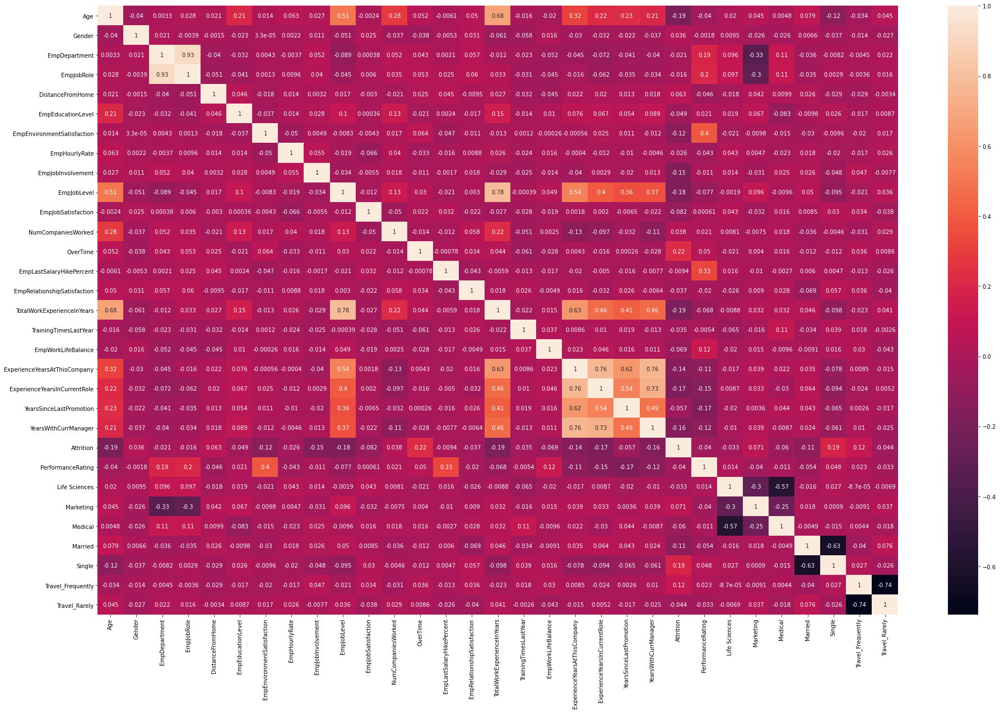

In [45]:
plt.rcParams['figure.figsize'] = 32,20
mult_corr = df.corr()
sns.heatmap(mult_corr,annot=True)
plt.show()

-> Here we can idendtify the columns which are correlated to each other.

In [46]:
drop_col = set()
for i in range(len(mult_corr)):
    for j in range(i):
        if abs(mult_corr.iloc[i,j]) > 0.8:
            column = mult_corr.columns[i]
            drop_col.add(column)

In [47]:
drop_col

{'EmpJobRole'}

-> It is found that EmpJobRole is highly corelated. It is also observed during pandas profiling. So it is better to drop EmpJobRole

In [48]:
df.drop(columns=drop_col,inplace=True)
df.shape

(1200, 30)

-> Sucessfully removed EmpJobRole

### 4. Removing columns which are less correlated with the target variable

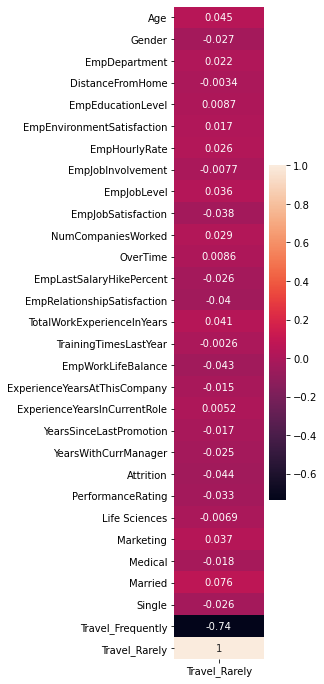

In [49]:
plt.rcParams["figure.figsize"] = 2,12 
sns.heatmap(df.corr().iloc[:,-1:],annot=True)

In [50]:
drop_col =set()
for i in enumerate(df.corr()["PerformanceRating"]):
    if abs(i[1]) < 0.1:
        column = df.corr().columns[i[0]]
        drop_col.add(column)

In [51]:
drop_col

{'Age',
 'Attrition',
 'DistanceFromHome',
 'EmpEducationLevel',
 'EmpHourlyRate',
 'EmpJobInvolvement',
 'EmpJobLevel',
 'EmpJobSatisfaction',
 'EmpRelationshipSatisfaction',
 'Gender',
 'Life Sciences',
 'Marketing',
 'Married',
 'Medical',
 'NumCompaniesWorked',
 'OverTime',
 'Single',
 'TotalWorkExperienceInYears',
 'TrainingTimesLastYear',
 'Travel_Frequently',
 'Travel_Rarely'}

-> These columns are having less corelation with the target variable. So we can drop these columns.

In [52]:
df.drop(columns=drop_col,inplace=True)
df.shape

(1200, 9)

-> sucessfully removed columns which is having less corealtion with the target varaiable.

# 6. Checking whether the data is normally distributed

In [53]:
plt.rcParams['figure.figsize'] = 10,5
import pylab
def plotfigure (df,feature):
    print('skewness :' , stats.skew(df[feature]))
    print('kurtosis :' , stats.kurtosis(df[feature]))
    plt.subplot(1,2,1)
    sns.distplot(df[feature],kde=True)
    plt.subplot(1,2,2)
    stats.probplot(df[feature],plot=pylab)
    plt.show()

EmpDepartment
skewness : 0.4462604206455372
kurtosis : -1.3779391236867495


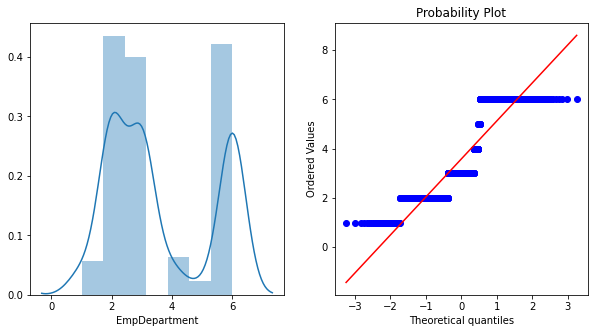

EmpEnvironmentSatisfaction
skewness : -0.30728009854747024
kurtosis : -1.2055559189315166


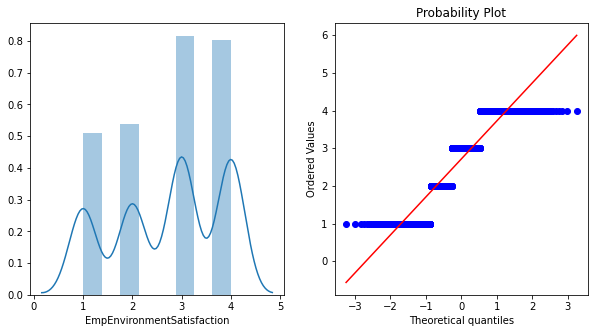

EmpLastSalaryHikePercent
skewness : 0.8076424650015763
kurtosis : -0.3034891485530884


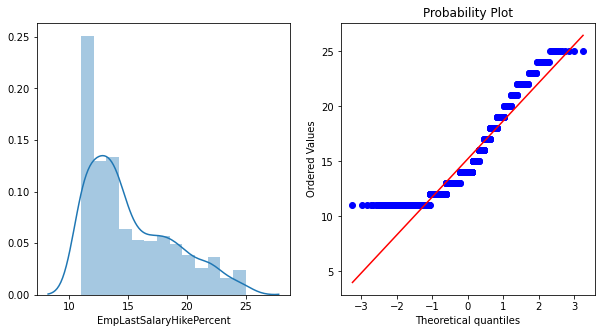

EmpWorkLifeBalance
skewness : -0.5385567854332284
kurtosis : 0.38996068107395176


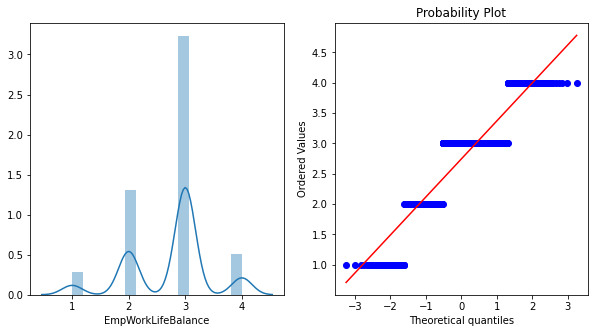

ExperienceYearsAtThisCompany
skewness : 1.7868178842417548
kurtosis : 4.036075117916915


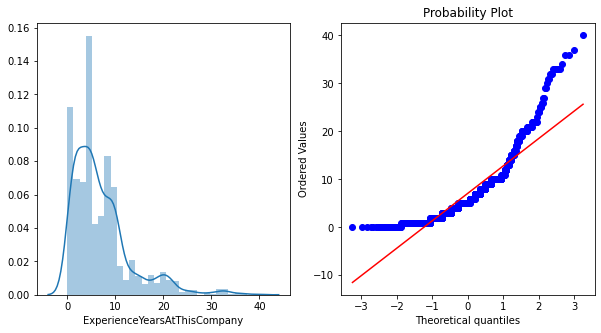

ExperienceYearsInCurrentRole
skewness : 0.8870480862786159
kurtosis : 0.431209859131672


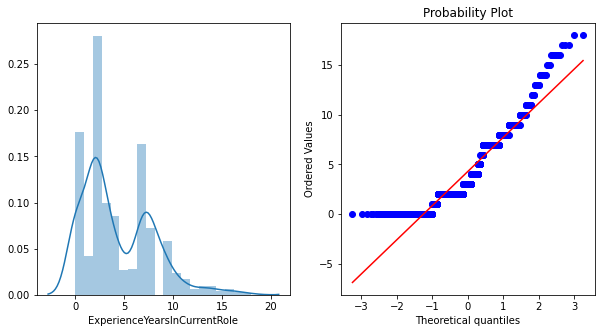

YearsSinceLastPromotion
skewness : 1.9724620367914252
kurtosis : 3.5193552691799805


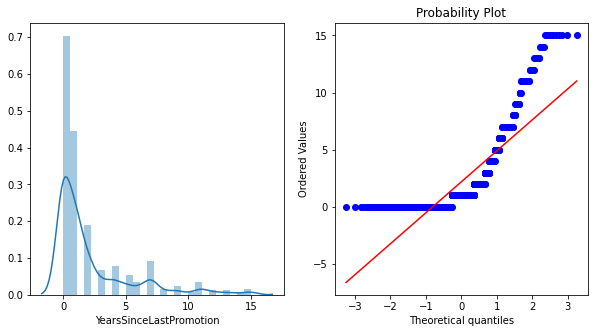

YearsWithCurrManager
skewness : 0.81214149476762
kurtosis : 0.14258902091102943


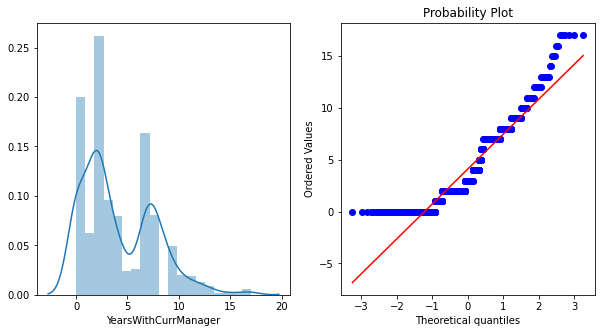

PerformanceRating
skewness : -0.07048817723822184
kurtosis : 0.6666738318217393


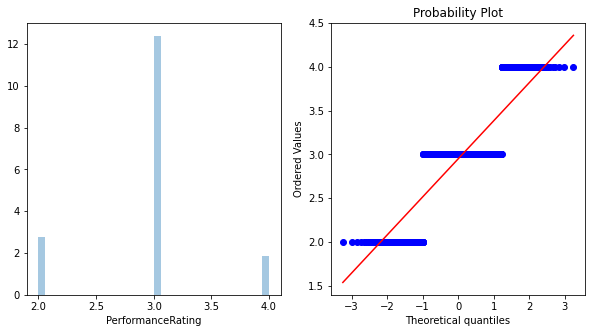

In [54]:
for i in df.columns:
    print(i)
    plotfigure(df,i)

-> By observing this plot we can distinguish the continous and discrete features.
We need to normalise the continous fetures if they are not normally distributed.

-> The continous features are :
    * ExperienceYearsAtThisCompany
    * ExperienceYearsInCurrentRole
    * YearsSinceLastPromotion
    * YearsWithCurrManager
    
-> Skewness range from -1 to 1 and kurtosis range from -2 to 2. If the continues features are not uniformly distributed we have to normalize the feature.

* ExperienceYearsAtThisCompany and YearsSinceLastPromotion is not uniformly distributed. So we have to normalize the data

### Normalizing the features

##### 1. ExperienceYearsAtThisCompany

In [55]:
# Using Log tranformation method

exp = np.log1p(df.ExperienceYearsAtThisCompany)
print('skewnwss :', stats.skew(exp))
print('kurtosis :', stats.kurtosis(exp))

skewnwss : -0.19810385804168135
kurtosis : -0.297246664263918


-> Sucessfully converted. So we can transform the data.

In [56]:
df.ExperienceYearsAtThisCompany = exp

-> Sucessfully convereted

##### 2. YearsSinceLastPromotion

In [57]:
# using log transformation method
years = np.log1p(df.YearsSinceLastPromotion)
print('skewnwss :', stats.skew(years))
print('kurtosis :', stats.kurtosis(years))

skewnwss : 0.7150525376833343
kurtosis : -0.5981884317901489


-> Sucessfully converted. So we can transform the data

In [58]:
df.YearsSinceLastPromotion = years

-> Sucessfully converted

# 7. Checking for outliers on Continuous feature

#### 1.ExperienceYearsAtThisCompany 

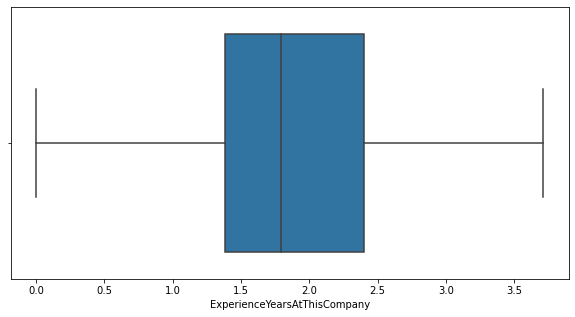

In [59]:
sns.boxplot(df.ExperienceYearsAtThisCompany)

-> NO Outliers found

#### 2. ExperienceYearsInCurrentRole

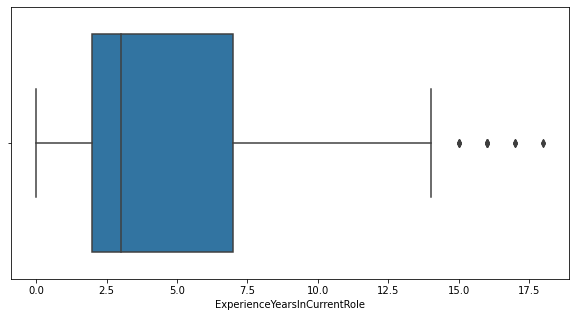

In [60]:
sns.boxplot(df.ExperienceYearsInCurrentRole)

-> Outliers are present

In [61]:
# Using IQR to remove the outliers
IQR = df.ExperienceYearsInCurrentRole.quantile(0.75) - df.ExperienceYearsInCurrentRole.quantile(0.25)
upper_bridge = df.ExperienceYearsInCurrentRole.quantile(0.75) + (1.5*IQR)
lower_bridge = df.ExperienceYearsInCurrentRole.quantile(0.75) - (1.5*IQR)
print('IQR   :' ,IQR)
print('upper_bridge :',upper_bridge)
print('lower_bridge :',lower_bridge)

IQR   : 5.0
upper_bridge : 14.5
lower_bridge : -0.5


-> ExperienceYearsInCurrentRole cannot be negative so we can neglect the lower_bridge.

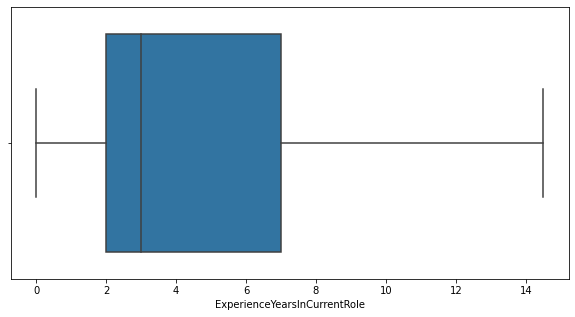

In [62]:
df.loc[df.ExperienceYearsInCurrentRole > upper_bridge,'ExperienceYearsInCurrentRole'] = upper_bridge
sns.boxplot(df.ExperienceYearsInCurrentRole)

-> Sucessfully removed the outliers

### 3. YearsSinceLastPromotion

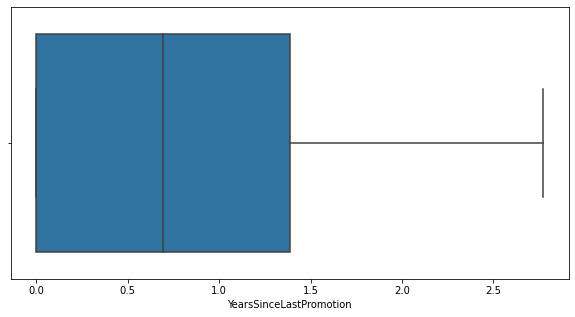

In [63]:
sns.boxplot(df.YearsSinceLastPromotion)

-> NO outliers found

### 4.YearsWithCurrManager 

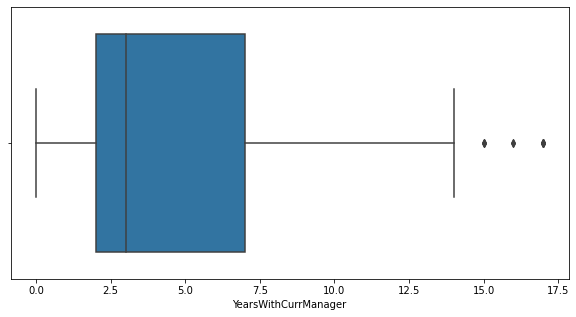

In [64]:
sns.boxplot(df.YearsWithCurrManager)

In [65]:
# Using IQR to remove the outliers
IQR = df.YearsWithCurrManager.quantile(0.75) - df.YearsWithCurrManager.quantile(0.25)
upper_bridge = df.YearsWithCurrManager.quantile(0.75) + (1.5*IQR)
lower_bridge = df.YearsWithCurrManager.quantile(0.75) - (1.5*IQR)
print('IQR   :' ,IQR)
print('upper_bridge :',upper_bridge)
print('lower_bridge :',lower_bridge)

IQR   : 5.0
upper_bridge : 14.5
lower_bridge : -0.5


-> Lower_bridge is negative hence it can be neglected.

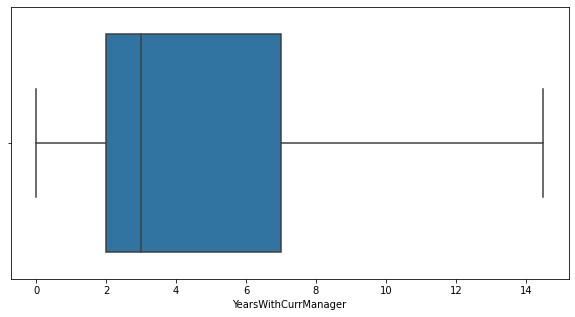

In [66]:
df.loc[df.YearsWithCurrManager > upper_bridge,'YearsWithCurrManager'] = upper_bridge
sns.boxplot(df.YearsWithCurrManager)

-> Outliers sucessfully removed

# 8. Defining Indipendent and Dependent Features

In [67]:
x = df.drop(columns=['PerformanceRating'])
y = df.PerformanceRating

# 9. Spltting the Data

In [68]:
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.3,random_state=41)

# 10. Balancing the imbalanced dataset using SMOTE

In [69]:
y_train.value_counts()

3    622
2    131
4     87
Name: PerformanceRating, dtype: int64

In [70]:
smote = SMOTE(k_neighbors=3)
x_train_sm,y_train_sm = smote.fit_resample(x_train,y_train)

4    622
3    622
2    622
Name: PerformanceRating, dtype: int64


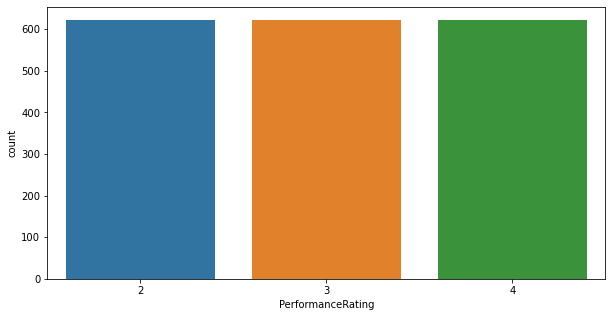

In [71]:
print(y_train_sm.value_counts())
sns.countplot(y_train_sm)
plt.show()

-> Now the data is balanced and we can proceed for modelling

# 11. Model selection

### 1 Logistic Regression

In [72]:
log = LogisticRegression()
log.fit(x_train_sm,y_train_sm)
y_predict = log.predict(x_test)
accuracy_score(y_test,y_predict)

0.7333333333333333

In [73]:
pd.crosstab(y_test,y_predict)

col_0,2,3,4
PerformanceRating,,,
2,40,16,7
3,24,189,39
4,3,7,35


In [74]:
print(classification_report(y_test,y_predict))

              precision    recall  f1-score   support

           2       0.60      0.63      0.62        63
           3       0.89      0.75      0.81       252
           4       0.43      0.78      0.56        45

    accuracy                           0.73       360
   macro avg       0.64      0.72      0.66       360
weighted avg       0.78      0.73      0.75       360



# Accuracy of Logistic Regerssion = 73.3%

### 2. Decision Tree

In [75]:
tree = DecisionTreeClassifier(random_state=24)
tree.fit(x_train_sm,y_train_sm)
y_predict = tree.predict(x_test)
accuracy_score(y_test,y_predict)

0.8972222222222223

In [76]:
pd.crosstab(y_test,y_predict)

col_0,2,3,4
PerformanceRating,,,
2,52,10,1
3,6,237,9
4,1,10,34


In [77]:
print(classification_report(y_test,y_predict))

              precision    recall  f1-score   support

           2       0.88      0.83      0.85        63
           3       0.92      0.94      0.93       252
           4       0.77      0.76      0.76        45

    accuracy                           0.90       360
   macro avg       0.86      0.84      0.85       360
weighted avg       0.90      0.90      0.90       360



# Accuracy of Decision Tree = 89.7%

### 3. Xgboost

In [78]:
xg = XGBClassifier()
xg.fit(x_train_sm,y_train_sm)
y_pred = xg.predict(x_test)
accuracy_score(y_test,y_pred)

[11:20:53] WARNING: ..\src\learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


0.9333333333333333

In [79]:
pd.crosstab(y_test,y_pred)

col_0,2,3,4
PerformanceRating,,,
2,55,8,0
3,3,245,4
4,0,9,36


In [80]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           2       0.95      0.87      0.91        63
           3       0.94      0.97      0.95       252
           4       0.90      0.80      0.85        45

    accuracy                           0.93       360
   macro avg       0.93      0.88      0.90       360
weighted avg       0.93      0.93      0.93       360



#### K_fold Cross_validation

In [81]:
scores = cross_val_score(xg,x,y,cv=8,scoring='accuracy')
print(scores)
print('MEAN : ',scores.mean())
print('STD : ', scores.std())

[11:20:54] WARNING: ..\src\learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[11:20:54] WARNING: ..\src\learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[11:20:54] WARNING: ..\src\learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[11:20:55] WARNING: ..\src\learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the ol

-> Since K_fold is close to the predicted values we can conclude that the model is not overfitting.

#### Hyperparameter tuning

In [82]:
parameters = {
    "learning_rate"    : [0.05, 0.10, 0.15, 0.20, 0.25, 0.30 ] ,
    "max_depth"        : [ 3, 4, 5, 6, 8, 10, 12, 15],
     
     "gamma"            : [ 0.0, 0.1, 0.2 , 0.3, 0.4 ],
}
   

In [83]:
grid = RandomizedSearchCV(xg,parameters,scoring='accuracy',cv=3)
grid.fit(x_train_sm,y_train_sm)
print(grid.best_params_)
print(grid.best_score_)

[11:20:57] WARNING: ..\src\learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[11:20:57] WARNING: ..\src\learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[11:20:58] WARNING: ..\src\learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[11:20:58] WARNING: ..\src\learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the ol

#### Remodelling

In [84]:
xg = XGBClassifier(
               
    
    max_depth=10,
    
    learning_rate=0.15,
    
    gamma = 0.3
)
xg.fit(x_train_sm,y_train_sm)
y_pred = xg.predict(x_test)
accuracy_score(y_test,y_pred)

[11:21:11] WARNING: ..\src\learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


0.9416666666666667

In [85]:
pd.crosstab(y_test,y_pred)

col_0,2,3,4
PerformanceRating,,,
2,59,4,0
3,1,244,7
4,0,9,36


In [86]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           2       0.98      0.94      0.96        63
           3       0.95      0.97      0.96       252
           4       0.84      0.80      0.82        45

    accuracy                           0.94       360
   macro avg       0.92      0.90      0.91       360
weighted avg       0.94      0.94      0.94       360



-> We can see a slight increase in the accuracy of the model

# Accuracy of Xgboost = 94.1%

### 4. Random Forest

In [87]:
rand = RandomForestClassifier(random_state=43)
rand.fit(x_train_sm,y_train_sm)
y_predict = rand.predict(x_test)
accuracy_score(y_test,y_predict)

0.9472222222222222

In [88]:
pd.crosstab(y_test,y_predict)

col_0,2,3,4
PerformanceRating,,,
2,59,4,0
3,2,246,4
4,0,9,36


In [89]:
print(classification_report(y_test,y_predict))

              precision    recall  f1-score   support

           2       0.97      0.94      0.95        63
           3       0.95      0.98      0.96       252
           4       0.90      0.80      0.85        45

    accuracy                           0.95       360
   macro avg       0.94      0.90      0.92       360
weighted avg       0.95      0.95      0.95       360



#### K_fold cross validation

In [90]:
scores = cross_val_score(rand,x,y,cv=8,scoring='accuracy')
print(scores)
print('MEAN : ',scores.mean())
print('STD : ', scores.std())

[0.88666667 0.94       0.94666667 0.98666667 0.97333333 0.91333333
 0.89333333 0.89333333]
MEAN :  0.9291666666666667
STD :  0.03589142577893006


-> Since the k_fold value is close to the predicted values. we can conclude that our model is not overfitting.

#### Hyperparameter tuning

In [91]:
parameters = { 
                #"random_state"       : [10,13,23,24,40],
                "n_estimators"       : [50,80,100,120,150],
                "min_samples_split"  : [2,4,8,10],
                "min_samples_leaf"   : [1,3,5,7],
                "max_depth"          : [10,20,30]
            }

In [92]:
grid = RandomizedSearchCV(rand,parameters,scoring='accuracy',cv=3)
grid.fit(x_train_sm,y_train_sm)
print(grid.best_params_)
print(grid.best_score_)

{'n_estimators': 80, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_depth': 30}
0.9571275455519829


#### Remodelling

In [118]:
rand = RandomForestClassifier(random_state=225,
                             n_estimators = 80,
                             min_samples_split = 2,
                             min_samples_leaf = 1,
                             max_depth = 30)
rand.fit(x_train_sm,y_train_sm)
y_predict = rand.predict(x_test)
accuracy_score(y_test,y_predict)

0.9527777777777777

In [94]:
pd.crosstab(y_test,y_predict)

col_0,2,3,4
PerformanceRating,,,
2,59,4,0
3,3,244,5
4,0,9,36


In [95]:
print(classification_report(y_test,y_predict))

              precision    recall  f1-score   support

           2       0.95      0.94      0.94        63
           3       0.95      0.97      0.96       252
           4       0.88      0.80      0.84        45

    accuracy                           0.94       360
   macro avg       0.93      0.90      0.91       360
weighted avg       0.94      0.94      0.94       360



-> Here we can see an increase in the accuracy and also we can see a better precision and recall compared with the other models.

# Accuracy of Random forest = 95.3%

#### Important Features

In [96]:
imp = pd.DataFrame(data=rand.feature_importances_,columns=['feature_importance'],index=['EmpDepartment', 'EmpEnvironmentSatisfaction',
       'EmpLastSalaryHikePercent', 'EmpWorkLifeBalance',
       'ExperienceYearsAtThisCompany', 'ExperienceYearsInCurrentRole',
       'YearsSinceLastPromotion', 'YearsWithCurrManager'])

imp = imp.sort_values(by='feature_importance',ascending=False)
imp

,feature_importance
EmpLastSalaryHikePercent,0.309226
EmpEnvironmentSatisfaction,0.270833
YearsSinceLastPromotion,0.136038
ExperienceYearsInCurrentRole,0.069422
EmpDepartment,0.060608
ExperienceYearsAtThisCompany,0.057614
EmpWorkLifeBalance,0.050199
YearsWithCurrManager,0.046059


### 5. CAT boost

In [97]:
cat = CatBoostClassifier(iterations=1000)
cat.fit(x_train,y_train)

Learning rate set to 0.078426
0:	learn: 0.9979864	total: 147ms	remaining: 2m 26s
1:	learn: 0.9290488	total: 149ms	remaining: 1m 14s
2:	learn: 0.8731808	total: 152ms	remaining: 50.5s
3:	learn: 0.8085522	total: 154ms	remaining: 38.5s
4:	learn: 0.7564813	total: 157ms	remaining: 31.2s
5:	learn: 0.7114231	total: 159ms	remaining: 26.4s
6:	learn: 0.6710049	total: 162ms	remaining: 22.9s
7:	learn: 0.6364710	total: 164ms	remaining: 20.3s
8:	learn: 0.6060540	total: 166ms	remaining: 18.3s
9:	learn: 0.5784342	total: 168ms	remaining: 16.7s
10:	learn: 0.5496258	total: 171ms	remaining: 15.4s
11:	learn: 0.5248198	total: 173ms	remaining: 14.3s
12:	learn: 0.5014714	total: 175ms	remaining: 13.3s
13:	learn: 0.4832244	total: 178ms	remaining: 12.6s
14:	learn: 0.4606530	total: 181ms	remaining: 11.9s
15:	learn: 0.4437698	total: 183ms	remaining: 11.3s
16:	learn: 0.4317771	total: 186ms	remaining: 10.7s
17:	learn: 0.4203332	total: 188ms	remaining: 10.3s
18:	learn: 0.4063322	total: 190ms	remaining: 9.81s
19:	learn

215:	learn: 0.0996573	total: 662ms	remaining: 2.4s
216:	learn: 0.0992701	total: 665ms	remaining: 2.4s
217:	learn: 0.0989267	total: 667ms	remaining: 2.39s
218:	learn: 0.0986723	total: 670ms	remaining: 2.39s
219:	learn: 0.0982684	total: 672ms	remaining: 2.38s
220:	learn: 0.0980489	total: 675ms	remaining: 2.38s
221:	learn: 0.0976919	total: 677ms	remaining: 2.37s
222:	learn: 0.0974299	total: 680ms	remaining: 2.37s
223:	learn: 0.0972074	total: 682ms	remaining: 2.36s
224:	learn: 0.0969895	total: 685ms	remaining: 2.36s
225:	learn: 0.0966358	total: 687ms	remaining: 2.35s
226:	learn: 0.0963595	total: 690ms	remaining: 2.35s
227:	learn: 0.0961067	total: 692ms	remaining: 2.34s
228:	learn: 0.0954821	total: 694ms	remaining: 2.34s
229:	learn: 0.0951334	total: 697ms	remaining: 2.33s
230:	learn: 0.0948744	total: 699ms	remaining: 2.33s
231:	learn: 0.0946193	total: 702ms	remaining: 2.32s
232:	learn: 0.0943692	total: 704ms	remaining: 2.32s
233:	learn: 0.0938707	total: 706ms	remaining: 2.31s
234:	learn: 0.

411:	learn: 0.0599758	total: 1.14s	remaining: 1.63s
412:	learn: 0.0598410	total: 1.14s	remaining: 1.63s
413:	learn: 0.0597673	total: 1.15s	remaining: 1.62s
414:	learn: 0.0595919	total: 1.15s	remaining: 1.62s
415:	learn: 0.0595025	total: 1.15s	remaining: 1.62s
416:	learn: 0.0593891	total: 1.15s	remaining: 1.61s
417:	learn: 0.0592530	total: 1.16s	remaining: 1.61s
418:	learn: 0.0591799	total: 1.16s	remaining: 1.61s
419:	learn: 0.0590692	total: 1.16s	remaining: 1.6s
420:	learn: 0.0589260	total: 1.16s	remaining: 1.6s
421:	learn: 0.0588351	total: 1.17s	remaining: 1.6s
422:	learn: 0.0586642	total: 1.17s	remaining: 1.59s
423:	learn: 0.0585641	total: 1.17s	remaining: 1.59s
424:	learn: 0.0584036	total: 1.17s	remaining: 1.59s
425:	learn: 0.0583077	total: 1.18s	remaining: 1.58s
426:	learn: 0.0581997	total: 1.18s	remaining: 1.58s
427:	learn: 0.0581041	total: 1.18s	remaining: 1.58s
428:	learn: 0.0579558	total: 1.18s	remaining: 1.57s
429:	learn: 0.0578631	total: 1.19s	remaining: 1.57s
430:	learn: 0.0

618:	learn: 0.0404889	total: 1.62s	remaining: 995ms
619:	learn: 0.0404223	total: 1.62s	remaining: 993ms
620:	learn: 0.0403681	total: 1.62s	remaining: 990ms
621:	learn: 0.0403040	total: 1.62s	remaining: 987ms
622:	learn: 0.0402011	total: 1.63s	remaining: 984ms
623:	learn: 0.0401640	total: 1.63s	remaining: 982ms
624:	learn: 0.0400822	total: 1.63s	remaining: 979ms
625:	learn: 0.0399752	total: 1.63s	remaining: 976ms
626:	learn: 0.0399308	total: 1.64s	remaining: 973ms
627:	learn: 0.0398279	total: 1.64s	remaining: 971ms
628:	learn: 0.0397651	total: 1.64s	remaining: 968ms
629:	learn: 0.0396979	total: 1.64s	remaining: 965ms
630:	learn: 0.0396086	total: 1.65s	remaining: 962ms
631:	learn: 0.0395351	total: 1.65s	remaining: 960ms
632:	learn: 0.0394865	total: 1.65s	remaining: 957ms
633:	learn: 0.0394247	total: 1.65s	remaining: 954ms
634:	learn: 0.0393527	total: 1.66s	remaining: 951ms
635:	learn: 0.0393204	total: 1.66s	remaining: 949ms
636:	learn: 0.0392362	total: 1.66s	remaining: 946ms
637:	learn: 

822:	learn: 0.0302585	total: 2.1s	remaining: 451ms
823:	learn: 0.0301695	total: 2.1s	remaining: 448ms
824:	learn: 0.0301160	total: 2.1s	remaining: 446ms
825:	learn: 0.0300890	total: 2.1s	remaining: 443ms
826:	learn: 0.0300318	total: 2.1s	remaining: 440ms
827:	learn: 0.0300042	total: 2.11s	remaining: 438ms
828:	learn: 0.0299560	total: 2.11s	remaining: 435ms
829:	learn: 0.0299358	total: 2.11s	remaining: 432ms
830:	learn: 0.0299041	total: 2.11s	remaining: 429ms
831:	learn: 0.0298597	total: 2.11s	remaining: 427ms
832:	learn: 0.0297797	total: 2.12s	remaining: 424ms
833:	learn: 0.0297375	total: 2.12s	remaining: 422ms
834:	learn: 0.0296796	total: 2.12s	remaining: 419ms
835:	learn: 0.0296452	total: 2.12s	remaining: 416ms
836:	learn: 0.0296027	total: 2.12s	remaining: 414ms
837:	learn: 0.0295879	total: 2.13s	remaining: 411ms
838:	learn: 0.0295531	total: 2.13s	remaining: 408ms
839:	learn: 0.0295124	total: 2.13s	remaining: 406ms
840:	learn: 0.0294858	total: 2.13s	remaining: 403ms
841:	learn: 0.029

In [98]:
y_pred = cat.predict(x_test)
cn = confusion_matrix(y_test,y_pred)
print('Confusion matrix : ', cn ,'\n')
ac = accuracy_score(y_test,y_pred)
print('accuracy score :', ac, '\n')
print(classification_report(y_test,y_pred))

Confusion matrix :  [[ 57   6   0]
 [  2 243   7]
 [  1   9  35]] 

accuracy score : 0.9305555555555556 

              precision    recall  f1-score   support

           2       0.95      0.90      0.93        63
           3       0.94      0.96      0.95       252
           4       0.83      0.78      0.80        45

    accuracy                           0.93       360
   macro avg       0.91      0.88      0.89       360
weighted avg       0.93      0.93      0.93       360



#### K_fold cross validation

In [99]:
scores = cross_val_score(cat, x,y, cv=5, scoring='accuracy')
print(scores)
print('MEAN : ',scores.mean())
print('STD : ', scores.std())

Learning rate set to 0.078962
0:	learn: 0.9907082	total: 3.14ms	remaining: 3.14s
1:	learn: 0.9113332	total: 5.58ms	remaining: 2.79s
2:	learn: 0.8546252	total: 8.49ms	remaining: 2.82s
3:	learn: 0.7941719	total: 11.2ms	remaining: 2.79s
4:	learn: 0.7377983	total: 14.1ms	remaining: 2.8s
5:	learn: 0.6912625	total: 16.9ms	remaining: 2.81s
6:	learn: 0.6514864	total: 19.4ms	remaining: 2.75s
7:	learn: 0.6219273	total: 21.9ms	remaining: 2.71s
8:	learn: 0.5875211	total: 24.7ms	remaining: 2.72s
9:	learn: 0.5562546	total: 26.8ms	remaining: 2.66s
10:	learn: 0.5243247	total: 28.6ms	remaining: 2.57s
11:	learn: 0.4995041	total: 30.1ms	remaining: 2.48s
12:	learn: 0.4752324	total: 32.2ms	remaining: 2.44s
13:	learn: 0.4559439	total: 33.8ms	remaining: 2.38s
14:	learn: 0.4353313	total: 35.2ms	remaining: 2.31s
15:	learn: 0.4176126	total: 36.6ms	remaining: 2.25s
16:	learn: 0.4012608	total: 37.9ms	remaining: 2.19s
17:	learn: 0.3869064	total: 39.2ms	remaining: 2.14s
18:	learn: 0.3740375	total: 41.3ms	remaining:

205:	learn: 0.0823480	total: 479ms	remaining: 1.85s
206:	learn: 0.0818396	total: 482ms	remaining: 1.84s
207:	learn: 0.0816400	total: 484ms	remaining: 1.84s
208:	learn: 0.0814953	total: 487ms	remaining: 1.84s
209:	learn: 0.0812009	total: 489ms	remaining: 1.84s
210:	learn: 0.0809113	total: 492ms	remaining: 1.84s
211:	learn: 0.0805784	total: 494ms	remaining: 1.84s
212:	learn: 0.0802127	total: 497ms	remaining: 1.84s
213:	learn: 0.0797905	total: 500ms	remaining: 1.83s
214:	learn: 0.0796348	total: 502ms	remaining: 1.83s
215:	learn: 0.0794183	total: 505ms	remaining: 1.83s
216:	learn: 0.0791391	total: 507ms	remaining: 1.83s
217:	learn: 0.0788256	total: 509ms	remaining: 1.82s
218:	learn: 0.0785423	total: 510ms	remaining: 1.82s
219:	learn: 0.0782811	total: 512ms	remaining: 1.81s
220:	learn: 0.0780663	total: 514ms	remaining: 1.81s
221:	learn: 0.0777341	total: 515ms	remaining: 1.8s
222:	learn: 0.0774513	total: 518ms	remaining: 1.8s
223:	learn: 0.0772662	total: 519ms	remaining: 1.8s
224:	learn: 0.0

399:	learn: 0.0463786	total: 973ms	remaining: 1.46s
400:	learn: 0.0462923	total: 976ms	remaining: 1.46s
401:	learn: 0.0461926	total: 979ms	remaining: 1.46s
402:	learn: 0.0460750	total: 982ms	remaining: 1.46s
403:	learn: 0.0459506	total: 985ms	remaining: 1.45s
404:	learn: 0.0459008	total: 988ms	remaining: 1.45s
405:	learn: 0.0458325	total: 991ms	remaining: 1.45s
406:	learn: 0.0457654	total: 994ms	remaining: 1.45s
407:	learn: 0.0456410	total: 997ms	remaining: 1.45s
408:	learn: 0.0455831	total: 1s	remaining: 1.45s
409:	learn: 0.0454535	total: 1s	remaining: 1.44s
410:	learn: 0.0454167	total: 1.01s	remaining: 1.44s
411:	learn: 0.0452382	total: 1.01s	remaining: 1.44s
412:	learn: 0.0451254	total: 1.01s	remaining: 1.44s
413:	learn: 0.0449844	total: 1.01s	remaining: 1.44s
414:	learn: 0.0448539	total: 1.02s	remaining: 1.43s
415:	learn: 0.0447529	total: 1.02s	remaining: 1.43s
416:	learn: 0.0446557	total: 1.02s	remaining: 1.43s
417:	learn: 0.0445402	total: 1.03s	remaining: 1.43s
418:	learn: 0.0444

576:	learn: 0.0316842	total: 1.46s	remaining: 1.07s
577:	learn: 0.0316088	total: 1.46s	remaining: 1.07s
578:	learn: 0.0314972	total: 1.46s	remaining: 1.06s
579:	learn: 0.0314168	total: 1.47s	remaining: 1.06s
580:	learn: 0.0313957	total: 1.47s	remaining: 1.06s
581:	learn: 0.0313408	total: 1.47s	remaining: 1.06s
582:	learn: 0.0312855	total: 1.47s	remaining: 1.05s
583:	learn: 0.0312236	total: 1.48s	remaining: 1.05s
584:	learn: 0.0311556	total: 1.48s	remaining: 1.05s
585:	learn: 0.0311161	total: 1.48s	remaining: 1.05s
586:	learn: 0.0310483	total: 1.48s	remaining: 1.04s
587:	learn: 0.0309856	total: 1.49s	remaining: 1.04s
588:	learn: 0.0309276	total: 1.49s	remaining: 1.04s
589:	learn: 0.0308876	total: 1.49s	remaining: 1.04s
590:	learn: 0.0308586	total: 1.5s	remaining: 1.03s
591:	learn: 0.0308058	total: 1.5s	remaining: 1.03s
592:	learn: 0.0307306	total: 1.5s	remaining: 1.03s
593:	learn: 0.0307028	total: 1.5s	remaining: 1.03s
594:	learn: 0.0306753	total: 1.5s	remaining: 1.02s
595:	learn: 0.030

762:	learn: 0.0234810	total: 1.94s	remaining: 602ms
763:	learn: 0.0234651	total: 1.94s	remaining: 599ms
764:	learn: 0.0234298	total: 1.94s	remaining: 597ms
765:	learn: 0.0233812	total: 1.95s	remaining: 595ms
766:	learn: 0.0233563	total: 1.95s	remaining: 592ms
767:	learn: 0.0233358	total: 1.95s	remaining: 590ms
768:	learn: 0.0233050	total: 1.95s	remaining: 587ms
769:	learn: 0.0232944	total: 1.96s	remaining: 585ms
770:	learn: 0.0232611	total: 1.96s	remaining: 582ms
771:	learn: 0.0231901	total: 1.96s	remaining: 580ms
772:	learn: 0.0231624	total: 1.97s	remaining: 577ms
773:	learn: 0.0231318	total: 1.97s	remaining: 575ms
774:	learn: 0.0231024	total: 1.97s	remaining: 573ms
775:	learn: 0.0230410	total: 1.98s	remaining: 570ms
776:	learn: 0.0230051	total: 1.98s	remaining: 568ms
777:	learn: 0.0229791	total: 1.98s	remaining: 566ms
778:	learn: 0.0229555	total: 1.98s	remaining: 563ms
779:	learn: 0.0229440	total: 1.99s	remaining: 561ms
780:	learn: 0.0229250	total: 1.99s	remaining: 558ms
781:	learn: 

950:	learn: 0.0183242	total: 2.43s	remaining: 125ms
951:	learn: 0.0183020	total: 2.44s	remaining: 123ms
952:	learn: 0.0182733	total: 2.44s	remaining: 120ms
953:	learn: 0.0182592	total: 2.44s	remaining: 118ms
954:	learn: 0.0182334	total: 2.44s	remaining: 115ms
955:	learn: 0.0182179	total: 2.44s	remaining: 113ms
956:	learn: 0.0181928	total: 2.45s	remaining: 110ms
957:	learn: 0.0181670	total: 2.45s	remaining: 107ms
958:	learn: 0.0181450	total: 2.45s	remaining: 105ms
959:	learn: 0.0181252	total: 2.46s	remaining: 102ms
960:	learn: 0.0181115	total: 2.46s	remaining: 99.8ms
961:	learn: 0.0180833	total: 2.46s	remaining: 97.2ms
962:	learn: 0.0180646	total: 2.46s	remaining: 94.6ms
963:	learn: 0.0180474	total: 2.46s	remaining: 92.1ms
964:	learn: 0.0180284	total: 2.47s	remaining: 89.5ms
965:	learn: 0.0180099	total: 2.47s	remaining: 87ms
966:	learn: 0.0179904	total: 2.47s	remaining: 84.4ms
967:	learn: 0.0179786	total: 2.48s	remaining: 81.8ms
968:	learn: 0.0179663	total: 2.48s	remaining: 79.3ms
969:	

130:	learn: 0.1422073	total: 320ms	remaining: 2.12s
131:	learn: 0.1414792	total: 321ms	remaining: 2.11s
132:	learn: 0.1409474	total: 323ms	remaining: 2.11s
133:	learn: 0.1403137	total: 325ms	remaining: 2.1s
134:	learn: 0.1394032	total: 327ms	remaining: 2.1s
135:	learn: 0.1387732	total: 329ms	remaining: 2.09s
136:	learn: 0.1380455	total: 331ms	remaining: 2.08s
137:	learn: 0.1375131	total: 333ms	remaining: 2.08s
138:	learn: 0.1364284	total: 335ms	remaining: 2.07s
139:	learn: 0.1358661	total: 337ms	remaining: 2.07s
140:	learn: 0.1353399	total: 339ms	remaining: 2.06s
141:	learn: 0.1346627	total: 341ms	remaining: 2.06s
142:	learn: 0.1341471	total: 343ms	remaining: 2.06s
143:	learn: 0.1339594	total: 346ms	remaining: 2.06s
144:	learn: 0.1336002	total: 348ms	remaining: 2.05s
145:	learn: 0.1329548	total: 351ms	remaining: 2.05s
146:	learn: 0.1323453	total: 353ms	remaining: 2.05s
147:	learn: 0.1317053	total: 356ms	remaining: 2.05s
148:	learn: 0.1311696	total: 359ms	remaining: 2.05s
149:	learn: 0.

329:	learn: 0.0755716	total: 815ms	remaining: 1.66s
330:	learn: 0.0753839	total: 817ms	remaining: 1.65s
331:	learn: 0.0751843	total: 819ms	remaining: 1.65s
332:	learn: 0.0750133	total: 821ms	remaining: 1.64s
333:	learn: 0.0748161	total: 822ms	remaining: 1.64s
334:	learn: 0.0745776	total: 824ms	remaining: 1.64s
335:	learn: 0.0742387	total: 825ms	remaining: 1.63s
336:	learn: 0.0740230	total: 827ms	remaining: 1.63s
337:	learn: 0.0738403	total: 828ms	remaining: 1.62s
338:	learn: 0.0736218	total: 829ms	remaining: 1.62s
339:	learn: 0.0735203	total: 831ms	remaining: 1.61s
340:	learn: 0.0733768	total: 832ms	remaining: 1.61s
341:	learn: 0.0732977	total: 833ms	remaining: 1.6s
342:	learn: 0.0730270	total: 835ms	remaining: 1.6s
343:	learn: 0.0729490	total: 836ms	remaining: 1.59s
344:	learn: 0.0729107	total: 838ms	remaining: 1.59s
345:	learn: 0.0727946	total: 839ms	remaining: 1.59s
346:	learn: 0.0726889	total: 842ms	remaining: 1.58s
347:	learn: 0.0725068	total: 843ms	remaining: 1.58s
348:	learn: 0.

534:	learn: 0.0500668	total: 1.3s	remaining: 1.13s
535:	learn: 0.0499752	total: 1.3s	remaining: 1.13s
536:	learn: 0.0498994	total: 1.3s	remaining: 1.12s
537:	learn: 0.0497908	total: 1.3s	remaining: 1.12s
538:	learn: 0.0497170	total: 1.31s	remaining: 1.12s
539:	learn: 0.0496377	total: 1.31s	remaining: 1.12s
540:	learn: 0.0495052	total: 1.31s	remaining: 1.11s
541:	learn: 0.0494723	total: 1.31s	remaining: 1.11s
542:	learn: 0.0494065	total: 1.32s	remaining: 1.11s
543:	learn: 0.0493445	total: 1.32s	remaining: 1.11s
544:	learn: 0.0491885	total: 1.32s	remaining: 1.1s
545:	learn: 0.0490389	total: 1.32s	remaining: 1.1s
546:	learn: 0.0489270	total: 1.33s	remaining: 1.1s
547:	learn: 0.0488478	total: 1.33s	remaining: 1.1s
548:	learn: 0.0487636	total: 1.33s	remaining: 1.09s
549:	learn: 0.0487053	total: 1.33s	remaining: 1.09s
550:	learn: 0.0485615	total: 1.34s	remaining: 1.09s
551:	learn: 0.0484949	total: 1.34s	remaining: 1.09s
552:	learn: 0.0484399	total: 1.34s	remaining: 1.08s
553:	learn: 0.048358

736:	learn: 0.0363285	total: 1.78s	remaining: 635ms
737:	learn: 0.0362664	total: 1.78s	remaining: 633ms
738:	learn: 0.0362380	total: 1.78s	remaining: 630ms
739:	learn: 0.0361840	total: 1.79s	remaining: 628ms
740:	learn: 0.0361494	total: 1.79s	remaining: 626ms
741:	learn: 0.0361032	total: 1.79s	remaining: 623ms
742:	learn: 0.0360326	total: 1.79s	remaining: 621ms
743:	learn: 0.0360023	total: 1.8s	remaining: 618ms
744:	learn: 0.0359557	total: 1.8s	remaining: 616ms
745:	learn: 0.0359014	total: 1.8s	remaining: 614ms
746:	learn: 0.0358548	total: 1.8s	remaining: 611ms
747:	learn: 0.0357909	total: 1.81s	remaining: 609ms
748:	learn: 0.0357448	total: 1.81s	remaining: 606ms
749:	learn: 0.0357003	total: 1.81s	remaining: 604ms
750:	learn: 0.0356514	total: 1.81s	remaining: 601ms
751:	learn: 0.0356098	total: 1.81s	remaining: 599ms
752:	learn: 0.0355873	total: 1.82s	remaining: 596ms
753:	learn: 0.0355500	total: 1.82s	remaining: 593ms
754:	learn: 0.0354736	total: 1.82s	remaining: 591ms
755:	learn: 0.03

940:	learn: 0.0282534	total: 2.37s	remaining: 149ms
941:	learn: 0.0282147	total: 2.38s	remaining: 146ms
942:	learn: 0.0281879	total: 2.38s	remaining: 144ms
943:	learn: 0.0281450	total: 2.38s	remaining: 141ms
944:	learn: 0.0281071	total: 2.38s	remaining: 139ms
945:	learn: 0.0280746	total: 2.38s	remaining: 136ms
946:	learn: 0.0280408	total: 2.39s	remaining: 134ms
947:	learn: 0.0280057	total: 2.39s	remaining: 131ms
948:	learn: 0.0279852	total: 2.39s	remaining: 129ms
949:	learn: 0.0279449	total: 2.4s	remaining: 126ms
950:	learn: 0.0279035	total: 2.4s	remaining: 124ms
951:	learn: 0.0278746	total: 2.4s	remaining: 121ms
952:	learn: 0.0278458	total: 2.4s	remaining: 119ms
953:	learn: 0.0278226	total: 2.41s	remaining: 116ms
954:	learn: 0.0278024	total: 2.41s	remaining: 114ms
955:	learn: 0.0277803	total: 2.41s	remaining: 111ms
956:	learn: 0.0277515	total: 2.41s	remaining: 108ms
957:	learn: 0.0277247	total: 2.42s	remaining: 106ms
958:	learn: 0.0276940	total: 2.42s	remaining: 103ms
959:	learn: 0.02

108:	learn: 0.1713669	total: 309ms	remaining: 2.52s
109:	learn: 0.1704218	total: 311ms	remaining: 2.52s
110:	learn: 0.1693759	total: 314ms	remaining: 2.52s
111:	learn: 0.1685557	total: 317ms	remaining: 2.51s
112:	learn: 0.1675639	total: 320ms	remaining: 2.51s
113:	learn: 0.1666336	total: 323ms	remaining: 2.51s
114:	learn: 0.1660940	total: 325ms	remaining: 2.5s
115:	learn: 0.1651129	total: 328ms	remaining: 2.5s
116:	learn: 0.1645321	total: 330ms	remaining: 2.49s
117:	learn: 0.1640364	total: 333ms	remaining: 2.49s
118:	learn: 0.1632124	total: 336ms	remaining: 2.48s
119:	learn: 0.1620951	total: 338ms	remaining: 2.48s
120:	learn: 0.1608589	total: 341ms	remaining: 2.48s
121:	learn: 0.1600634	total: 343ms	remaining: 2.47s
122:	learn: 0.1593130	total: 346ms	remaining: 2.46s
123:	learn: 0.1587228	total: 349ms	remaining: 2.46s
124:	learn: 0.1577686	total: 351ms	remaining: 2.46s
125:	learn: 0.1572595	total: 354ms	remaining: 2.45s
126:	learn: 0.1566985	total: 356ms	remaining: 2.45s
127:	learn: 0.

297:	learn: 0.0897622	total: 794ms	remaining: 1.87s
298:	learn: 0.0895460	total: 797ms	remaining: 1.87s
299:	learn: 0.0892354	total: 799ms	remaining: 1.86s
300:	learn: 0.0890599	total: 802ms	remaining: 1.86s
301:	learn: 0.0888637	total: 804ms	remaining: 1.86s
302:	learn: 0.0887019	total: 807ms	remaining: 1.86s
303:	learn: 0.0885477	total: 810ms	remaining: 1.85s
304:	learn: 0.0882071	total: 812ms	remaining: 1.85s
305:	learn: 0.0880431	total: 815ms	remaining: 1.85s
306:	learn: 0.0878278	total: 818ms	remaining: 1.84s
307:	learn: 0.0876645	total: 820ms	remaining: 1.84s
308:	learn: 0.0875988	total: 823ms	remaining: 1.84s
309:	learn: 0.0873519	total: 825ms	remaining: 1.84s
310:	learn: 0.0870881	total: 828ms	remaining: 1.83s
311:	learn: 0.0869000	total: 830ms	remaining: 1.83s
312:	learn: 0.0866581	total: 833ms	remaining: 1.83s
313:	learn: 0.0864475	total: 835ms	remaining: 1.82s
314:	learn: 0.0862969	total: 838ms	remaining: 1.82s
315:	learn: 0.0860435	total: 841ms	remaining: 1.82s
316:	learn: 

495:	learn: 0.0567458	total: 1.28s	remaining: 1.3s
496:	learn: 0.0566533	total: 1.28s	remaining: 1.3s
497:	learn: 0.0565509	total: 1.28s	remaining: 1.29s
498:	learn: 0.0564621	total: 1.29s	remaining: 1.29s
499:	learn: 0.0564244	total: 1.29s	remaining: 1.29s
500:	learn: 0.0563085	total: 1.29s	remaining: 1.28s
501:	learn: 0.0562601	total: 1.29s	remaining: 1.28s
502:	learn: 0.0561408	total: 1.29s	remaining: 1.28s
503:	learn: 0.0560168	total: 1.29s	remaining: 1.27s
504:	learn: 0.0559466	total: 1.29s	remaining: 1.27s
505:	learn: 0.0558535	total: 1.3s	remaining: 1.26s
506:	learn: 0.0557412	total: 1.3s	remaining: 1.26s
507:	learn: 0.0556614	total: 1.3s	remaining: 1.26s
508:	learn: 0.0555329	total: 1.3s	remaining: 1.25s
509:	learn: 0.0554652	total: 1.3s	remaining: 1.25s
510:	learn: 0.0553558	total: 1.3s	remaining: 1.25s
511:	learn: 0.0552921	total: 1.3s	remaining: 1.24s
512:	learn: 0.0552491	total: 1.31s	remaining: 1.24s
513:	learn: 0.0551776	total: 1.31s	remaining: 1.24s
514:	learn: 0.0550455

694:	learn: 0.0404475	total: 1.77s	remaining: 777ms
695:	learn: 0.0403967	total: 1.77s	remaining: 774ms
696:	learn: 0.0403621	total: 1.77s	remaining: 772ms
697:	learn: 0.0403059	total: 1.78s	remaining: 769ms
698:	learn: 0.0402632	total: 1.78s	remaining: 767ms
699:	learn: 0.0402393	total: 1.78s	remaining: 764ms
700:	learn: 0.0401655	total: 1.79s	remaining: 762ms
701:	learn: 0.0401124	total: 1.79s	remaining: 760ms
702:	learn: 0.0400629	total: 1.79s	remaining: 758ms
703:	learn: 0.0400241	total: 1.8s	remaining: 755ms
704:	learn: 0.0399742	total: 1.8s	remaining: 753ms
705:	learn: 0.0399193	total: 1.8s	remaining: 751ms
706:	learn: 0.0398558	total: 1.8s	remaining: 748ms
707:	learn: 0.0397643	total: 1.81s	remaining: 746ms
708:	learn: 0.0397125	total: 1.81s	remaining: 744ms
709:	learn: 0.0396568	total: 1.81s	remaining: 741ms
710:	learn: 0.0396099	total: 1.82s	remaining: 739ms
711:	learn: 0.0395475	total: 1.82s	remaining: 737ms
712:	learn: 0.0395002	total: 1.82s	remaining: 735ms
713:	learn: 0.03

899:	learn: 0.0307425	total: 2.24s	remaining: 249ms
900:	learn: 0.0307132	total: 2.25s	remaining: 247ms
901:	learn: 0.0306779	total: 2.25s	remaining: 244ms
902:	learn: 0.0306409	total: 2.25s	remaining: 242ms
903:	learn: 0.0306191	total: 2.25s	remaining: 239ms
904:	learn: 0.0305898	total: 2.26s	remaining: 237ms
905:	learn: 0.0305427	total: 2.26s	remaining: 234ms
906:	learn: 0.0304936	total: 2.26s	remaining: 232ms
907:	learn: 0.0304470	total: 2.27s	remaining: 230ms
908:	learn: 0.0304180	total: 2.27s	remaining: 227ms
909:	learn: 0.0303799	total: 2.27s	remaining: 225ms
910:	learn: 0.0303453	total: 2.27s	remaining: 222ms
911:	learn: 0.0303176	total: 2.28s	remaining: 220ms
912:	learn: 0.0302924	total: 2.28s	remaining: 217ms
913:	learn: 0.0302569	total: 2.28s	remaining: 215ms
914:	learn: 0.0302332	total: 2.29s	remaining: 212ms
915:	learn: 0.0302005	total: 2.29s	remaining: 210ms
916:	learn: 0.0301696	total: 2.29s	remaining: 207ms
917:	learn: 0.0301308	total: 2.29s	remaining: 205ms
918:	learn: 

90:	learn: 0.1542111	total: 162ms	remaining: 1.62s
91:	learn: 0.1526537	total: 165ms	remaining: 1.63s
92:	learn: 0.1523138	total: 167ms	remaining: 1.63s
93:	learn: 0.1516631	total: 170ms	remaining: 1.64s
94:	learn: 0.1504209	total: 173ms	remaining: 1.65s
95:	learn: 0.1495305	total: 176ms	remaining: 1.66s
96:	learn: 0.1487553	total: 179ms	remaining: 1.66s
97:	learn: 0.1479678	total: 181ms	remaining: 1.67s
98:	learn: 0.1469422	total: 184ms	remaining: 1.68s
99:	learn: 0.1463683	total: 187ms	remaining: 1.68s
100:	learn: 0.1458214	total: 190ms	remaining: 1.69s
101:	learn: 0.1443816	total: 192ms	remaining: 1.69s
102:	learn: 0.1437973	total: 195ms	remaining: 1.69s
103:	learn: 0.1431528	total: 197ms	remaining: 1.7s
104:	learn: 0.1424249	total: 199ms	remaining: 1.7s
105:	learn: 0.1417317	total: 202ms	remaining: 1.7s
106:	learn: 0.1409975	total: 205ms	remaining: 1.71s
107:	learn: 0.1401488	total: 208ms	remaining: 1.71s
108:	learn: 0.1392256	total: 211ms	remaining: 1.72s
109:	learn: 0.1386029	tot

276:	learn: 0.0800958	total: 647ms	remaining: 1.69s
277:	learn: 0.0797760	total: 649ms	remaining: 1.69s
278:	learn: 0.0796552	total: 652ms	remaining: 1.68s
279:	learn: 0.0793561	total: 654ms	remaining: 1.68s
280:	learn: 0.0791983	total: 657ms	remaining: 1.68s
281:	learn: 0.0790951	total: 660ms	remaining: 1.68s
282:	learn: 0.0789991	total: 663ms	remaining: 1.68s
283:	learn: 0.0787637	total: 666ms	remaining: 1.68s
284:	learn: 0.0785332	total: 668ms	remaining: 1.68s
285:	learn: 0.0784704	total: 671ms	remaining: 1.68s
286:	learn: 0.0782027	total: 675ms	remaining: 1.68s
287:	learn: 0.0778675	total: 678ms	remaining: 1.68s
288:	learn: 0.0776885	total: 680ms	remaining: 1.67s
289:	learn: 0.0775404	total: 683ms	remaining: 1.67s
290:	learn: 0.0772994	total: 685ms	remaining: 1.67s
291:	learn: 0.0769655	total: 688ms	remaining: 1.67s
292:	learn: 0.0766805	total: 691ms	remaining: 1.67s
293:	learn: 0.0763675	total: 694ms	remaining: 1.67s
294:	learn: 0.0760580	total: 697ms	remaining: 1.67s
295:	learn: 

474:	learn: 0.0502210	total: 1.13s	remaining: 1.25s
475:	learn: 0.0501247	total: 1.14s	remaining: 1.25s
476:	learn: 0.0500463	total: 1.14s	remaining: 1.25s
477:	learn: 0.0499330	total: 1.14s	remaining: 1.25s
478:	learn: 0.0498726	total: 1.14s	remaining: 1.25s
479:	learn: 0.0498014	total: 1.15s	remaining: 1.24s
480:	learn: 0.0497128	total: 1.15s	remaining: 1.24s
481:	learn: 0.0496710	total: 1.15s	remaining: 1.24s
482:	learn: 0.0495540	total: 1.15s	remaining: 1.23s
483:	learn: 0.0494764	total: 1.15s	remaining: 1.23s
484:	learn: 0.0494021	total: 1.16s	remaining: 1.23s
485:	learn: 0.0492997	total: 1.16s	remaining: 1.22s
486:	learn: 0.0492427	total: 1.16s	remaining: 1.22s
487:	learn: 0.0491703	total: 1.16s	remaining: 1.22s
488:	learn: 0.0490535	total: 1.16s	remaining: 1.22s
489:	learn: 0.0489689	total: 1.17s	remaining: 1.21s
490:	learn: 0.0488858	total: 1.17s	remaining: 1.21s
491:	learn: 0.0488178	total: 1.17s	remaining: 1.21s
492:	learn: 0.0487530	total: 1.17s	remaining: 1.21s
493:	learn: 

663:	learn: 0.0361051	total: 1.61s	remaining: 814ms
664:	learn: 0.0360733	total: 1.61s	remaining: 812ms
665:	learn: 0.0359979	total: 1.61s	remaining: 809ms
666:	learn: 0.0359528	total: 1.62s	remaining: 807ms
667:	learn: 0.0359016	total: 1.62s	remaining: 805ms
668:	learn: 0.0358682	total: 1.62s	remaining: 802ms
669:	learn: 0.0358153	total: 1.62s	remaining: 800ms
670:	learn: 0.0357677	total: 1.63s	remaining: 797ms
671:	learn: 0.0356955	total: 1.63s	remaining: 795ms
672:	learn: 0.0356693	total: 1.63s	remaining: 793ms
673:	learn: 0.0356017	total: 1.63s	remaining: 790ms
674:	learn: 0.0355513	total: 1.64s	remaining: 788ms
675:	learn: 0.0355070	total: 1.64s	remaining: 785ms
676:	learn: 0.0353958	total: 1.64s	remaining: 783ms
677:	learn: 0.0353256	total: 1.64s	remaining: 781ms
678:	learn: 0.0352719	total: 1.65s	remaining: 778ms
679:	learn: 0.0352152	total: 1.65s	remaining: 776ms
680:	learn: 0.0351923	total: 1.65s	remaining: 773ms
681:	learn: 0.0351604	total: 1.65s	remaining: 771ms
682:	learn: 

855:	learn: 0.0278938	total: 2.09s	remaining: 352ms
856:	learn: 0.0278604	total: 2.09s	remaining: 350ms
857:	learn: 0.0278411	total: 2.1s	remaining: 347ms
858:	learn: 0.0278085	total: 2.1s	remaining: 344ms
859:	learn: 0.0277711	total: 2.1s	remaining: 342ms
860:	learn: 0.0277317	total: 2.1s	remaining: 339ms
861:	learn: 0.0276674	total: 2.1s	remaining: 337ms
862:	learn: 0.0276218	total: 2.1s	remaining: 334ms
863:	learn: 0.0275799	total: 2.1s	remaining: 331ms
864:	learn: 0.0275339	total: 2.11s	remaining: 329ms
865:	learn: 0.0274955	total: 2.11s	remaining: 326ms
866:	learn: 0.0274386	total: 2.11s	remaining: 324ms
867:	learn: 0.0274208	total: 2.11s	remaining: 321ms
868:	learn: 0.0273924	total: 2.11s	remaining: 318ms
869:	learn: 0.0273581	total: 2.11s	remaining: 316ms
870:	learn: 0.0273228	total: 2.11s	remaining: 313ms
871:	learn: 0.0272688	total: 2.12s	remaining: 311ms
872:	learn: 0.0272428	total: 2.12s	remaining: 308ms
873:	learn: 0.0272160	total: 2.12s	remaining: 306ms
874:	learn: 0.02719

61:	learn: 0.1844373	total: 156ms	remaining: 2.35s
62:	learn: 0.1821723	total: 158ms	remaining: 2.35s
63:	learn: 0.1798616	total: 161ms	remaining: 2.35s
64:	learn: 0.1788324	total: 163ms	remaining: 2.35s
65:	learn: 0.1774094	total: 166ms	remaining: 2.35s
66:	learn: 0.1761768	total: 170ms	remaining: 2.36s
67:	learn: 0.1746999	total: 172ms	remaining: 2.36s
68:	learn: 0.1734750	total: 175ms	remaining: 2.36s
69:	learn: 0.1720959	total: 177ms	remaining: 2.36s
70:	learn: 0.1703343	total: 180ms	remaining: 2.35s
71:	learn: 0.1690516	total: 183ms	remaining: 2.35s
72:	learn: 0.1676876	total: 185ms	remaining: 2.35s
73:	learn: 0.1667387	total: 188ms	remaining: 2.35s
74:	learn: 0.1655452	total: 191ms	remaining: 2.35s
75:	learn: 0.1650115	total: 193ms	remaining: 2.35s
76:	learn: 0.1634118	total: 196ms	remaining: 2.35s
77:	learn: 0.1615460	total: 199ms	remaining: 2.35s
78:	learn: 0.1612100	total: 202ms	remaining: 2.35s
79:	learn: 0.1597726	total: 205ms	remaining: 2.36s
80:	learn: 0.1587972	total: 208

252:	learn: 0.0793721	total: 660ms	remaining: 1.95s
253:	learn: 0.0792734	total: 663ms	remaining: 1.95s
254:	learn: 0.0790070	total: 665ms	remaining: 1.94s
255:	learn: 0.0788722	total: 668ms	remaining: 1.94s
256:	learn: 0.0786718	total: 670ms	remaining: 1.94s
257:	learn: 0.0783526	total: 673ms	remaining: 1.94s
258:	learn: 0.0780397	total: 676ms	remaining: 1.93s
259:	learn: 0.0776386	total: 678ms	remaining: 1.93s
260:	learn: 0.0775119	total: 681ms	remaining: 1.93s
261:	learn: 0.0772610	total: 683ms	remaining: 1.92s
262:	learn: 0.0771226	total: 685ms	remaining: 1.92s
263:	learn: 0.0770080	total: 688ms	remaining: 1.92s
264:	learn: 0.0767871	total: 691ms	remaining: 1.92s
265:	learn: 0.0764469	total: 693ms	remaining: 1.91s
266:	learn: 0.0762395	total: 696ms	remaining: 1.91s
267:	learn: 0.0761270	total: 698ms	remaining: 1.91s
268:	learn: 0.0759918	total: 701ms	remaining: 1.9s
269:	learn: 0.0757300	total: 703ms	remaining: 1.9s
270:	learn: 0.0753750	total: 706ms	remaining: 1.9s
271:	learn: 0.0

448:	learn: 0.0474160	total: 1.15s	remaining: 1.41s
449:	learn: 0.0473303	total: 1.15s	remaining: 1.41s
450:	learn: 0.0472756	total: 1.15s	remaining: 1.4s
451:	learn: 0.0470713	total: 1.15s	remaining: 1.4s
452:	learn: 0.0469598	total: 1.16s	remaining: 1.4s
453:	learn: 0.0468428	total: 1.16s	remaining: 1.39s
454:	learn: 0.0467224	total: 1.16s	remaining: 1.39s
455:	learn: 0.0466195	total: 1.16s	remaining: 1.39s
456:	learn: 0.0464569	total: 1.17s	remaining: 1.39s
457:	learn: 0.0463218	total: 1.17s	remaining: 1.38s
458:	learn: 0.0462139	total: 1.17s	remaining: 1.38s
459:	learn: 0.0460676	total: 1.17s	remaining: 1.38s
460:	learn: 0.0459850	total: 1.18s	remaining: 1.38s
461:	learn: 0.0458446	total: 1.18s	remaining: 1.37s
462:	learn: 0.0457417	total: 1.18s	remaining: 1.37s
463:	learn: 0.0456200	total: 1.18s	remaining: 1.37s
464:	learn: 0.0455149	total: 1.19s	remaining: 1.36s
465:	learn: 0.0454395	total: 1.19s	remaining: 1.36s
466:	learn: 0.0452817	total: 1.19s	remaining: 1.36s
467:	learn: 0.0

636:	learn: 0.0326514	total: 1.63s	remaining: 927ms
637:	learn: 0.0326137	total: 1.63s	remaining: 924ms
638:	learn: 0.0325794	total: 1.63s	remaining: 922ms
639:	learn: 0.0325245	total: 1.63s	remaining: 919ms
640:	learn: 0.0324914	total: 1.64s	remaining: 917ms
641:	learn: 0.0324288	total: 1.64s	remaining: 914ms
642:	learn: 0.0323628	total: 1.64s	remaining: 912ms
643:	learn: 0.0323001	total: 1.64s	remaining: 909ms
644:	learn: 0.0322316	total: 1.65s	remaining: 906ms
645:	learn: 0.0321992	total: 1.65s	remaining: 904ms
646:	learn: 0.0321447	total: 1.65s	remaining: 901ms
647:	learn: 0.0321169	total: 1.65s	remaining: 899ms
648:	learn: 0.0321005	total: 1.66s	remaining: 896ms
649:	learn: 0.0320740	total: 1.66s	remaining: 894ms
650:	learn: 0.0320392	total: 1.66s	remaining: 891ms
651:	learn: 0.0319688	total: 1.66s	remaining: 889ms
652:	learn: 0.0318955	total: 1.67s	remaining: 886ms
653:	learn: 0.0318396	total: 1.67s	remaining: 883ms
654:	learn: 0.0317597	total: 1.67s	remaining: 881ms
655:	learn: 

834:	learn: 0.0244898	total: 2.11s	remaining: 417ms
835:	learn: 0.0244718	total: 2.12s	remaining: 415ms
836:	learn: 0.0244388	total: 2.12s	remaining: 412ms
837:	learn: 0.0244059	total: 2.12s	remaining: 410ms
838:	learn: 0.0243701	total: 2.12s	remaining: 407ms
839:	learn: 0.0243391	total: 2.13s	remaining: 405ms
840:	learn: 0.0242949	total: 2.13s	remaining: 402ms
841:	learn: 0.0242800	total: 2.13s	remaining: 400ms
842:	learn: 0.0242451	total: 2.13s	remaining: 397ms
843:	learn: 0.0242252	total: 2.13s	remaining: 395ms
844:	learn: 0.0242007	total: 2.14s	remaining: 392ms
845:	learn: 0.0241845	total: 2.14s	remaining: 390ms
846:	learn: 0.0241639	total: 2.14s	remaining: 387ms
847:	learn: 0.0241424	total: 2.15s	remaining: 385ms
848:	learn: 0.0241134	total: 2.15s	remaining: 382ms
849:	learn: 0.0240549	total: 2.15s	remaining: 380ms
850:	learn: 0.0240271	total: 2.15s	remaining: 377ms
851:	learn: 0.0239828	total: 2.16s	remaining: 375ms
852:	learn: 0.0239257	total: 2.16s	remaining: 372ms
853:	learn: 

[0.91666667 0.92916667 0.97083333 0.9125     0.88333333]
MEAN :  0.9225
STD :  0.028455618464939797


-> K_fold  values are close to the predicted accuracy. So we can conclude that our model is not overfitting.

# Accuracy of CAT boost = 93.05%

# 12. Conclusion

### Department wise performance

* Development               :3.085873

* Data Science              :3.050000

* Human Resources           :2.925926

* Research & Development    :2.921283

* Sales                     :2.860590

* Finance                   :2.775510
    
This is obtained by grouping EmpDeparment with the PerformanceRating. By doing this we found the weak performing departments. Finace is the weakest among the other departments. R&D and sales  also has poor performance. So necessary actions can be taken on these depatments to increase their performance.

### Top 3 important factors effecting employee performance

In [100]:
imp.head(3)

,feature_importance
EmpLastSalaryHikePercent,0.309226
EmpEnvironmentSatisfaction,0.270833
YearsSinceLastPromotion,0.136038


-> Random Forest gives an accuracy of 95.3%. By using feature imporatance we have found top 3 features that affect the employee performance. The top 3 important features are: 

1. EmpLastSalaryHikePercent - Employee last salary hike percent

2. EmpEnvironmentSatisfaction - employee environment satisfaction

3. YearsSinceLastPromotion   - Years since last promotion

-> Employee last salary hike is positevely correlated to the performance rating. That is when the salary hike percentage increases the performance rate also increases.

-> Employee environment satisfaction also affects the performance rating. When the company provides a good working environment the employees will be able to work properly without any distraction, this will leads to an increased performance rating.

-> Years since last promotion is negatively correlated with the performance rating. When the number of years since last promotion increases that will definitely leads to a decrease in the performance rating.

### Analysis and insights

-> We have tried 5 different models. The accuracies obtained are:

* Accuracy of Logistic Regerssion = 73.3%

* Accuracy of Decision Tree = 89.7%

* Accuracy of Xgboost = 94.1%

* Accuracy of Random forest = 95.3%

* Accuracy of CAT boost = 93.05%

Random forest and Xgboost is performing well. But on closer observation in precision and f1 score we can find that Random forest is good with classification than xgboost.

-> The important features that are positively correalted are Last salary hike percent and Employee Environment Satisfaction. This means when these factors increases, performance rating also increases. On the other hand, Years Since Last Promotion, Experience Years in current role, Experience Years at this company and Years with Current Manager are negatively correlated. That means when these factors increases, Performance rating decreases. 


### Suggestions

-> The company need to provide better environment condition so that the employees can work efficiently without any distractions, which will gradually leads to an increased performance rating.

-> The company should increase the salary of the employee according to their experience, area of work etc.. without any failure.

-> The company can create a separate department to monitor the functioning of all other departments. This monitoring department should contain at least one members from each other departments. So they can monitor the performance rating of each departments separately  and can deal with the departments with poor performance rating.

-> Shuffling the managers from time to time will affect the performance. So, such kind of situations should be avoided.